In [28]:
#Import libraries
#loading dataset
import pandas as pd
import numpy as np

#visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly
import plotly.offline as pyo
from plotly.offline import iplot
import plotly.express as px
from plotly.subplots import make_subplots

# data splitting
from sklearn.model_selection import train_test_split

# data modeling
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

# Model performance
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from sklearn.model_selection import  KFold, cross_val_score, StratifiedKFold
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, classification_report, roc_curve , accuracy_score,plot_confusion_matrix
from sklearn import metrics
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#warnings
import warnings
warnings.simplefilter(action='ignore')

plt.style.use ('seaborn')
from sklearn.pipeline import Pipeline 

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [3]:
# Permanently changes the pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

# Load data

In [4]:
#loading data 
data= pd.read_csv("C:/Users/arnab/Downloads/train.csv")
data1=pd.read_csv("C:/Users/arnab/Downloads/test.csv")
df=pd.DataFrame(data)
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.5,1,3,0,22,0.7,164,1,7,1004,1654,1067,17,1,10,1,0,0,1
6,1821,0,1.7,0,4,1,10,0.8,139,8,10,381,1018,3220,13,8,18,1,0,1,3
7,1954,0,0.5,1,0,0,24,0.8,187,4,0,512,1149,700,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,14,386,836,1099,17,1,20,1,0,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,15,1137,1224,513,19,10,12,1,0,0,0


In [5]:
df1=pd.DataFrame(data1)
df1

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1
5,6,1464,1,2.9,1,5,1,50,0.8,198,8,9,569,939,3506,10,7,3,1,1,1
6,7,1718,0,2.4,0,1,0,47,1.0,156,2,3,1283,1374,3873,14,2,10,0,0,0
7,8,833,0,2.4,1,0,0,62,0.8,111,1,2,1312,1880,1495,7,2,18,0,1,1
8,9,1111,1,2.9,1,9,1,25,0.6,101,5,19,556,876,3485,11,9,10,1,1,0
9,10,1520,0,0.5,0,1,0,25,0.5,171,3,20,52,1009,651,6,0,5,1,0,1


In [6]:
# lists name of columns
data.columns 

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

battery_power:Total energy a battery can store in one time measured in mAh

blue:Has bluetooth or not

clock_speed:speed at which microprocessor executes instructions

dual_sim:Has dual sim support or not

fc:Front Camera mega pixels

four_g:Has 4G or not

int_memory:Internal Memory in Gigabytes

m_dep:Mobile Depth in cm

mobile_wt:Weight of mobile phone

n_cores:Number of cores of processor

pc:Primary Camera mega pixels

px_height:Pixel Resolution Height

px_width:Pixel Resolution Width

ram:Random Access Memory in Megabytes


sc_h:Screen Height of mobile in cm

sc_w:Screen Width of mobile in cm

talk_time:longest time that a single battery charge will last when you are

three_g:Has 3G or not

touch_screen:Has touch screen or not

wifi:Has wifi or not

price_range: This is the target variable with value of 0 (low cost), 1(medium cost), 2(high cost) and 3 (very high cost)


In [7]:
df=pd.DataFrame(data)
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.5,1,3,0,22,0.7,164,1,7,1004,1654,1067,17,1,10,1,0,0,1
6,1821,0,1.7,0,4,1,10,0.8,139,8,10,381,1018,3220,13,8,18,1,0,1,3
7,1954,0,0.5,1,0,0,24,0.8,187,4,0,512,1149,700,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,14,386,836,1099,17,1,20,1,0,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,15,1137,1224,513,19,10,12,1,0,0,0


# Data Pre-Processing 

In [8]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


data.describe function returns summary of dataset. Here

count column means number of values of each column are given,

mean column means numeric column's mean or average value

std means a measure of how dispersed the data is in relation to the mean or how far each value from mean value

min and max columns mean minimun amd maximum values

25% 50% 75% colums are if we have 100 sorted values then 25th 50th and 75th data. If mean value and 50% value are not -same or 
there have huge difference that data must be skewed

In [9]:
df1.describe()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000
mean,500.500000,1248.510000,0.516000,1.540900,0.517000,4.593000,0.487000,33.652000,0.517500,139.51100,4.328000,10.054000,627.121000,1239.774000,2138.998000,11.995000,5.316000,11.085000,0.756000,0.50000,0.507000
std,288.819436,432.458227,0.499994,0.829268,0.499961,4.463325,0.500081,18.128694,0.280861,34.85155,2.288155,6.095099,432.929699,439.670981,1088.092278,4.320607,4.240062,5.497636,0.429708,0.50025,0.500201
min,1.000000,500.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.00000,1.000000,0.000000,0.000000,501.000000,263.000000,5.000000,0.000000,2.000000,0.000000,0.00000,0.000000
25%,250.750000,895.000000,0.000000,0.700000,0.000000,1.000000,0.000000,18.000000,0.300000,109.75000,2.000000,5.000000,263.750000,831.750000,1237.250000,8.000000,2.000000,6.750000,1.000000,0.00000,0.000000
50%,500.500000,1246.500000,1.000000,1.500000,1.000000,3.000000,0.000000,34.500000,0.500000,139.00000,4.000000,10.000000,564.500000,1250.000000,2153.500000,12.000000,5.000000,11.000000,1.000000,0.50000,1.000000
75%,750.250000,1629.250000,1.000000,2.300000,1.000000,7.000000,1.000000,49.000000,0.800000,170.00000,6.000000,16.000000,903.000000,1637.750000,3065.500000,16.000000,8.000000,16.000000,1.000000,1.00000,1.000000
max,1000.000000,1999.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.00000,8.000000,20.000000,1907.000000,1998.000000,3989.000000,19.000000,18.000000,20.000000,1.000000,1.00000,1.000000


In [10]:
# checking the number of rows and columns in train dataset
rows,col=df.shape
print ('Row:' , rows,'\nColumns:',col)

Row: 2000 
Columns: 21


This dataset contais 21 columns and 2000 informations or rows 

In [11]:
# checking the number of rows and columns in test dataset
rows,col=df1.shape
print ('Row:' , rows,'\nColumns:',col)

Row: 1000 
Columns: 21


This dataset contais 21 columns and 1000 informations or rows

In [12]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [13]:
#number of null values in our test dataset
df1.isnull().sum()

id               0
battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
dtype: int64

In this dataset there is no Null value. 

In [14]:
#compare train and test dataset
compare= {'features':['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time'],
          'train_mean':[df.battery_power.mean(),df.clock_speed.mean(), df.fc.mean()
                       ,df.int_memory.mean(),df.m_dep.mean(),df.mobile_wt.mean(),df.pc.mean(),
                       df.px_height.mean(),df.px_width.mean(),df.ram.mean(),df.sc_h.mean(),
                       df.sc_w.mean(),df.talk_time.mean()],
          'test_mean': [df1.battery_power.mean(),df1.clock_speed.mean(), df1.fc.mean()
                       ,df1.int_memory.mean(),df1.m_dep.mean(),df1.mobile_wt.mean(),df1.pc.mean(),
                       df1.px_height.mean(),df1.px_width.mean(),df1.ram.mean(),df1.sc_h.mean(),
                       df1.sc_w.mean(),df1.talk_time.mean()]}
comparison = pd.DataFrame(compare)
comparison  

,features,train_mean,test_mean
0,battery_power,1238.51850,1248.5100
1,clock_speed,1.52225,1.5409
2,fc,4.30950,4.5930
3,int_memory,32.04650,33.6520
4,m_dep,0.50175,0.5175
5,mobile_wt,140.24900,139.5110
6,pc,9.91650,10.0540
7,px_height,645.10800,627.1210
8,px_width,1251.51550,1239.7740
9,ram,2124.21300,2138.9980


the mean of the train and the test dataset are close to each other. 

In [15]:
#getting some information about the datafram
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In this dataset execpt clock_speed and m_dep , every column type is integer. 

In [16]:
#To check number of uniqe elements in each columns.
df.nunique()

battery_power    1094
blue             2   
clock_speed      26  
dual_sim         2   
fc               20  
four_g           2   
int_memory       63  
m_dep            10  
mobile_wt        121 
n_cores          8   
pc               21  
px_height        1137
px_width         1109
ram              1562
sc_h             15  
sc_w             19  
talk_time        19  
three_g          2   
touch_screen     2   
wifi             2   
price_range      4   
dtype: int64

We will divide the variables into categorical and continuous, analyze them and draw conclusions. 

In [17]:
df.min()

battery_power    501.0
blue             0.0  
clock_speed      0.5  
dual_sim         0.0  
fc               0.0  
four_g           0.0  
int_memory       2.0  
m_dep            0.1  
mobile_wt        80.0 
n_cores          1.0  
pc               0.0  
px_height        0.0  
px_width         500.0
ram              256.0
sc_h             5.0  
sc_w             0.0  
talk_time        2.0  
three_g          0.0  
touch_screen     0.0  
wifi             0.0  
price_range      0.0  
dtype: float64

there are values equal to zero in both "px_height" and "sc_w". The problem with these points is that they cannot represent a feature of a mobile phone, as there is no 1D pixel or a 1D screen. 

In [18]:
px_mask = df['px_height'] == 0
sc_mask = df['sc_w'] == 0
print(f'pixel height = 0  :  {sum(px_mask)}')
print(f'screen width = 0  :  {sum(sc_mask)}')

pixel height = 0  :  2
screen width = 0  :  180


In [19]:
df=df[df['sc_w']>=2]
df=df[df['px_height']>0]
df.reset_index(inplace=True)
df.drop('index', axis=1, inplace=True)
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
5,1821,0,1.7,0,4,1,10,0.8,139,8,10,381,1018,3220,13,8,18,1,0,1,3
6,1954,0,0.5,1,0,0,24,0.8,187,4,0,512,1149,700,16,3,5,1,1,1,0
7,509,1,0.6,1,2,1,9,0.1,93,5,15,1137,1224,513,19,10,12,1,0,0,0
8,769,1,2.9,1,0,0,9,0.1,182,5,1,248,874,3946,5,2,7,0,0,0,3
9,1520,1,2.2,0,5,1,33,0.5,177,8,18,151,1005,3826,14,9,13,1,1,1,3


In [20]:
df.corr()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.037992,0.005418,-0.047783,0.022551,0.027102,0.004404,0.032451,0.014787,-0.029796,0.030813,0.005062,-0.000964,0.001063,-0.038397,-0.011044,0.056313,0.011032,0.004074,0.001426,0.196288
blue,0.037992,1.000000,0.019929,0.026651,-0.009882,0.007626,0.031269,0.013747,-0.034541,0.039419,-0.036116,-0.004938,-0.039250,0.021593,-0.020656,-0.032822,0.019897,-0.021975,-0.000717,-0.029449,0.022046
clock_speed,0.005418,0.019929,1.000000,-0.020580,-0.005582,-0.037279,0.018352,0.006269,-0.002346,-0.021661,-0.005255,-0.006889,-0.006037,-0.004060,-0.019668,0.015714,-0.012090,-0.037983,0.023417,-0.026162,-0.016139
dual_sim,-0.047783,0.026651,-0.020580,1.000000,-0.026336,0.001328,-0.023431,-0.015927,-0.007309,-0.018985,-0.016568,-0.030203,0.008284,0.050488,-0.003551,-0.004534,-0.013021,-0.006602,-0.016893,0.011553,0.022609
fc,0.022551,-0.009882,-0.005582,-0.026336,1.000000,-0.023061,-0.033497,-0.009455,0.028184,-0.025177,0.645338,-0.000137,-0.007737,0.008250,-0.003831,-0.012100,-0.012072,-0.009998,-0.008125,0.002553,0.012357
four_g,0.027102,0.007626,-0.037279,0.001328,-0.023061,1.000000,0.009992,0.000331,-0.006159,-0.001364,0.001746,-0.012064,0.008430,0.005811,0.028877,0.025918,-0.045836,0.585117,0.008655,-0.023417,0.015621
int_memory,0.004404,0.031269,0.018352,-0.023431,-0.033497,0.009992,1.000000,0.002357,-0.029394,-0.034957,-0.047480,0.007047,-0.011173,0.047140,0.026625,-0.005593,-0.024115,0.002111,-0.037262,0.028018,0.058975
m_dep,0.032451,0.013747,0.006269,-0.015927,-0.009455,0.000331,0.002357,1.000000,0.041124,-0.005939,0.035703,0.030582,0.026096,-0.013014,-0.025831,-0.017064,0.032721,-0.009212,0.012881,-0.015535,-0.000956
mobile_wt,0.014787,-0.034541,-0.002346,-0.007309,0.028184,-0.006159,-0.029394,0.041124,1.000000,-0.015273,0.029515,0.009776,0.011347,-0.001901,-0.032329,-0.025287,0.012159,-0.002070,-0.014091,-0.009858,-0.022835
n_cores,-0.029796,0.039419,-0.021661,-0.018985,-0.025177,-0.001364,-0.034957,-0.005939,-0.015273,1.000000,-0.007397,-0.006948,0.017039,-0.019554,0.003925,0.028792,-0.004247,0.001390,0.029871,-0.027634,-0.008647


In [21]:
# better to inspect the correlation of price_range vs. features specifically
price_range_corr = df.corr().sort_values(by = ["price_range"],
                                                 ascending = False).iloc[0].sort_values(ascending = False)
price_range_corr

price_range      1.000000
ram              0.917330
battery_power    0.196288
px_width         0.155291
px_height        0.145118
int_memory       0.058975
sc_w             0.058899
sc_h             0.027184
dual_sim         0.022609
blue             0.022046
three_g          0.019767
talk_time        0.015909
four_g           0.015621
fc               0.012357
pc               0.004713
wifi             0.004313
m_dep           -0.000956
n_cores         -0.008647
clock_speed     -0.016139
touch_screen    -0.020838
mobile_wt       -0.022835
Name: price_range, dtype: float64

# Exploratory Data Analysis (EDA)

<AxesSubplot:>

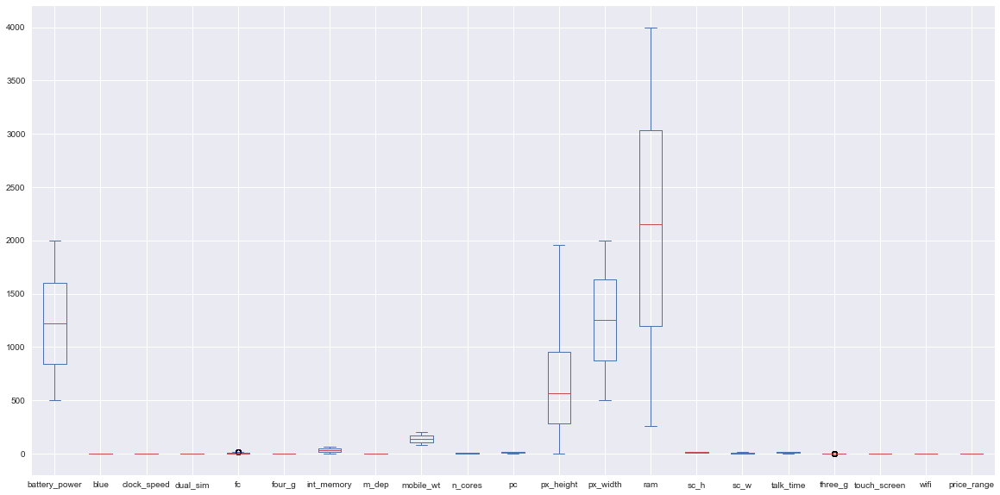

In [22]:
#vidualtion categorical and numerical data
df.plot(kind='box',figsize=(20,10))

In [23]:
# vidualtion categorical and numerical columns.
categorical_variables=[col for col in df.columns if df[col].nunique()<=8]
print('categorical:',categorical_variables)
continuous_variables=[col for col in df.columns if df[col].nunique()>8]
print('continuous:' ,continuous_variables)

categorical: ['blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi', 'price_range']
continuous: ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']


there are 8 categorical columns and 13 continuous columns

In [24]:
# check for cardinality in categorical variables
cate_cols=['blue', 'dual_sim','four_g','n_cores', 'three_g', 'touch_screen', 'wifi', 'price_range']
for var in cate_cols:
    
    print(var,':', ' contains ', len(df[var].unique()), ' labels')

blue :  contains  2  labels
dual_sim :  contains  2  labels
four_g :  contains  2  labels
n_cores :  contains  8  labels
three_g :  contains  2  labels
touch_screen :  contains  2  labels
wifi :  contains  2  labels
price_range :  contains  4  labels


blue :  contains  2  labels
dual_sim :  contains  2  labels
four_g :  contains  2  labels
n_cores :  contains  8  labels
three_g :  contains  2  labels
touch_screen :  contains  2  labels
wifi :  contains  2  labels
price_range :  contains  4  labels

# bluetooth

The number of mobiles phones that have bluetooth is almost equal to the number of mobile phones that do not

# Dual Sim

In [29]:
fig= px.histogram(data_frame = df, x = 'dual_sim', color = 'price_range',
             title = 'Comparison of devices sold having Dual Sim or not')
fig.update_layout({'bargap': 0.5}) 
fig.show()

1    812
0    797
Name: dual_sim, dtype: int64


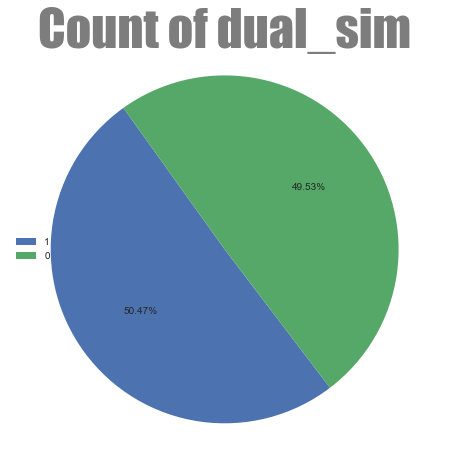

In [30]:
print(df['dual_sim'].value_counts())
size =df.dual_sim.value_counts().values/10 #List for take sizes
lbl=df.dual_sim.value_counts().index
plt.figure(figsize=(10,8)) #Size of plot
plt.title('Count of dual_sim',fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title
plt.pie(size ,startangle=125.6,autopct='%1.2f%%') #Pieplot
plt.legend(labels=lbl,loc='center left') #Help for plot
plt.show()

The number of mobiles phones with two Simcards is almost equal to the number of mobile phones without.

# 4G

In [31]:
fig= px.histogram(data_frame = df, x = 'four_g', color = 'price_range',
             title = 'Comparison of devices sold having 4G or not')
fig.update_layout({'bargap': 0.5}) 
fig.show()

1    851
0    758
Name: four_g, dtype: int64


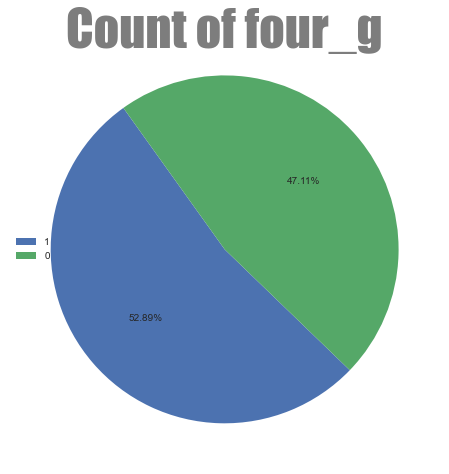

In [32]:
print(df['four_g'].value_counts())
size =df.four_g.value_counts().values/10 #List for take sizes
lbl=df.four_g.value_counts().index
plt.figure(figsize=(10,8)) #Size of plot
plt.title('Count of four_g',fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title
plt.pie(size ,startangle=125.6,autopct='%1.2f%%') #Pieplot
plt.legend(labels=lbl,loc='center left') #Help for plot
plt.show()

The number of mobiles phones that are 4-g is almost equal to the others that are not.

# n_cores

In [33]:
fig= px.histogram(data_frame = df, x = 'n_cores', color = 'price_range',
             title = 'Comparison of devices sold have different Cores')
fig.update_layout({'bargap': 0.5}) 
fig.show()

5    209
4    208
7    208
8    205
3    201
1    200
2    190
6    188
Name: n_cores, dtype: int64


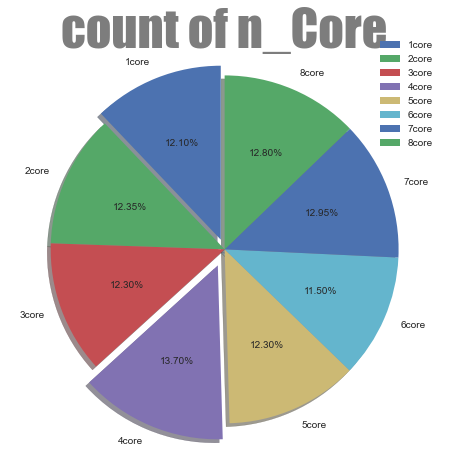

In [34]:
print(df['n_cores'].value_counts())
core_label = ['1core','2core','3core','4core','5core','6core','7core','8core']
core_size = [242,247,246,274,246,230,259,256]
core_explode = (0.06,0,0,0.1,0,0,0,0)

plt.figure(figsize=(10,8))
plt.pie( core_size , explode=core_explode , labels=core_label ,shadow=True , autopct='%1.2f%%' , startangle=90)
plt.title("count of n_Core",fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title)
plt.legend()
plt.show()

The number of 4-core mobiles phones is more than others, and the number of mobiles phones with fewer cores is almost equal

# 3G

In [35]:
fig= px.histogram(data_frame = df, x = 'three_g', color = 'price_range',
             title = 'Comparison of devices sold having 3G or not')
fig.update_layout({'bargap': 0.5}) 
fig.show()

1    1233
0    376 
Name: three_g, dtype: int64


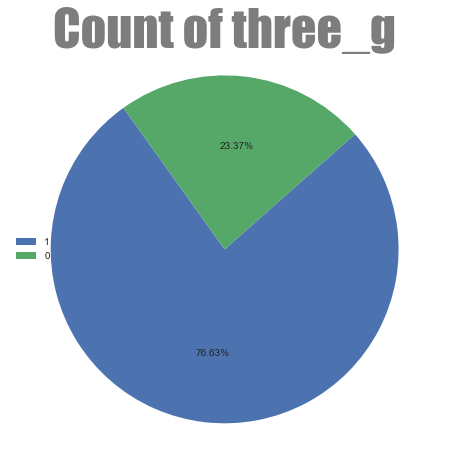

In [36]:
print(df['three_g'].value_counts())
size =df.three_g.value_counts().values/10 #List for take sizes
lbl=df.three_g.value_counts().index
plt.figure(figsize=(10,8)) #Size of plot
plt.title('Count of three_g',fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title
plt.pie(size ,startangle=125.6,autopct='%1.2f%%') #Pieplot
plt.legend(labels=lbl,loc='center left') #Help for plot
plt.show()

The number of mobiles phones that are 3-g is almost 3X that of mobiles that are not 3-g. 

# touch_screen

In [37]:
fig= px.histogram(data_frame = df, x = 'touch_screen', color = 'price_range',
             title = 'Comparison of devices sold having touch screen or not')
fig.update_layout({'bargap': 0.5}) 
fig.show()

1    814
0    795
Name: touch_screen, dtype: int64


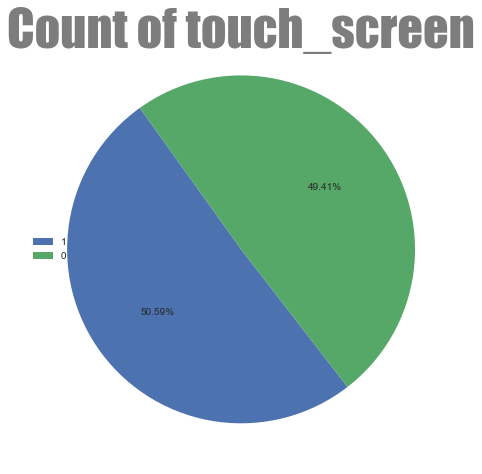

In [38]:
print(df['touch_screen'].value_counts())
size =df.touch_screen.value_counts().values/10 #List for take sizes
lbl=df.touch_screen.value_counts().index
plt.figure(figsize=(10,8)) #Size of plot
plt.title('Count of touch_screen',fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title
plt.pie(size ,startangle=125.6,autopct='%1.2f%%') #Pieplot
plt.legend(labels=lbl,loc='center left') #Help for plot
plt.show()

The number of mobiles phones that have a touch screen is almost equal to the number of mobile phones that are not.

# wifi

In [39]:
fig= px.histogram(data_frame = df, x = 'wifi', color = 'price_range',
             title = 'Comparison of devices sold having wifi or not')
fig.update_layout({'bargap': 0.5}) 
fig.show()

1    827
0    782
Name: wifi, dtype: int64


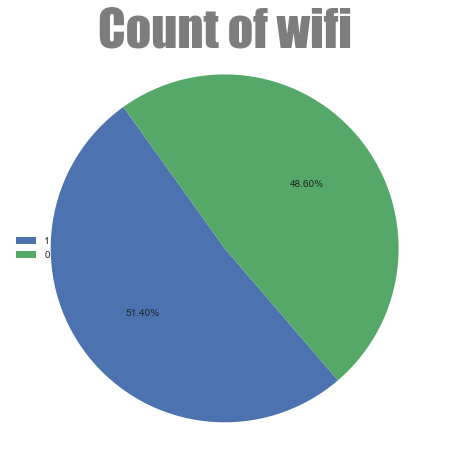

In [40]:
print(df['wifi'].value_counts())
size =df.wifi.value_counts().values/10 #List for take sizes
lbl=df.wifi.value_counts().index
plt.figure(figsize=(10,8)) #Size of plot
plt.title('Count of wifi',fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title
plt.pie(size ,startangle=125.6,autopct='%1.2f%%') #Pieplot
plt.legend(labels=lbl,loc='center left') #Help for plot
plt.show()

The number of mobiles phones that have Wifi is almost equal to the number of mobile phones that are not. 

# Price Range

2    408
0    404
1    401
3    396
Name: price_range, dtype: int64


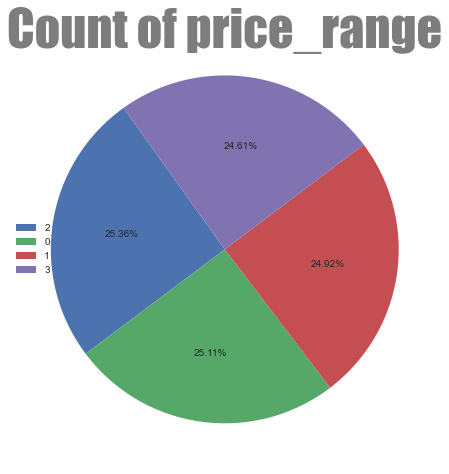

In [41]:
print(df['price_range'].value_counts())
size =df.price_range.value_counts().values/10 #List for take sizes
lbl=df.price_range.value_counts().index
plt.figure(figsize=(10,8)) #Size of plot
plt.title('Count of price_range',fontname='Impact',fontsize=50,y=.95,alpha=0.6) #Title
plt.pie(size ,startangle=125.6,autopct='%1.2f%%') #Pieplot
plt.legend(labels=lbl,loc='center left') #Help for plot
plt.show()

We have the same number of phone for every price range, that's a good things to learn and train a dataset

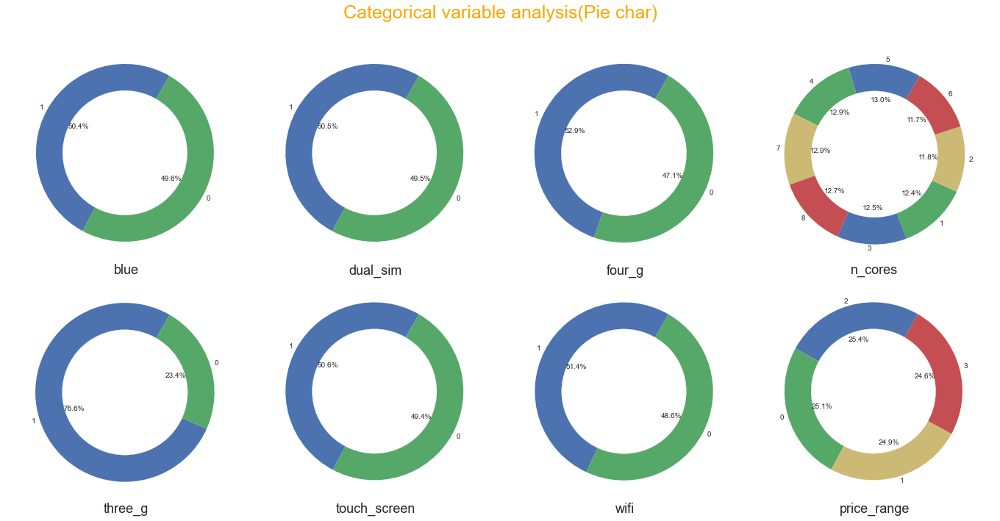

In [42]:
# another way to show pieplot
plt.figure(figsize = [19,10])
plt.suptitle('Categorical variable analysis(Pie char)\n', fontsize=25, c = 'orange')
colors = ['C6','C7', 'C4', 'C2']
i = 1
for col in cate_cols:
        plt.subplot(2,4,i)
        my_circle = plt.Circle((0, 0), 0.7, color='white')
        sizes = df[col].value_counts()
        d = plt.pie(sizes, colors = colors, labels = df[col].value_counts().index, autopct='%1.1f%%',
            startangle=60, labeldistance=1.05)
        plt.axis('equal')
        plt.gca().add_artist(my_circle)
            
        plt.xlabel(col, size=18)
        
        i+=1 
            
plt.tight_layout()
plt.show()

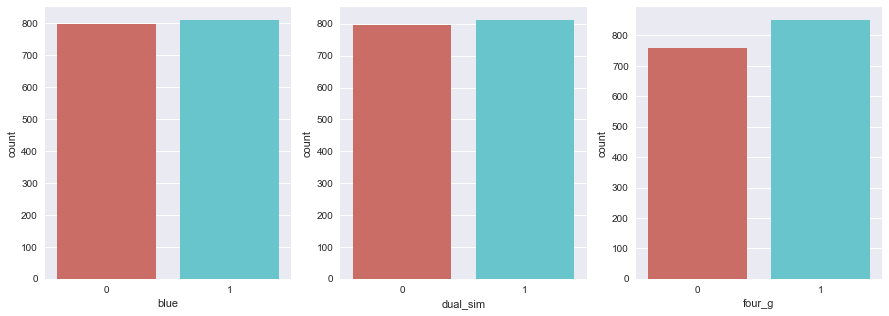

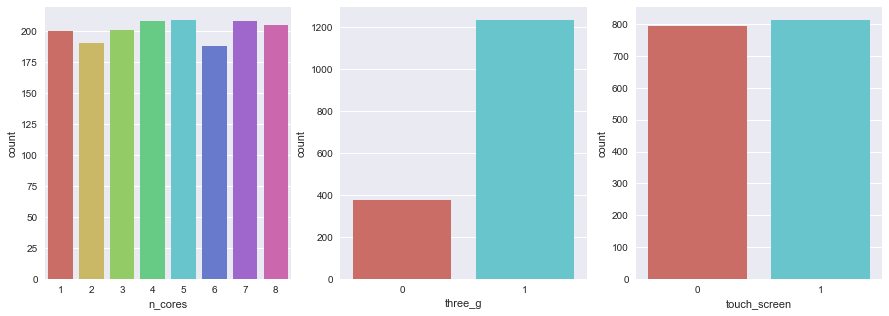

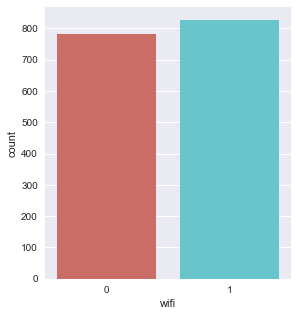

In [43]:
# checking categorical data count with countplot
cate_cols=['blue', 'dual_sim','four_g','n_cores', 'three_g', 'touch_screen', 'wifi', 'price_range']
i=0
while i <9:
    fig=plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    sns.countplot(x=cate_cols[i], data=df, palette = 'hls')
    i+=1
    if i==7:
        break
    plt.subplot(1,3,2)
    sns.countplot(x=cate_cols[i], data=df, palette = 'hls')
    i+=1
    plt.subplot(1,3,3)
    sns.countplot(x=cate_cols[i], data=df, palette = 'hls')
    i+=1
   
    plt.show()

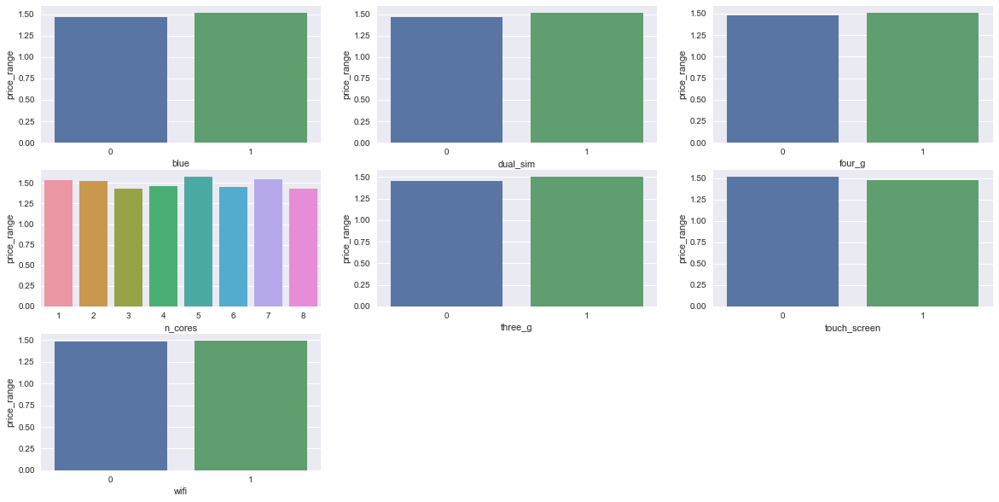

In [44]:
#categorical feature and target
cate_cols=['blue', 'dual_sim','four_g','n_cores', 'three_g', 'touch_screen', 'wifi']
fig=plt.figure(figsize=(20,10))
for i,col in enumerate(cate_cols):
    ax=fig.add_subplot(3,3,i+1)
    sns.barplot(x=col,y='price_range',data=df,ci=None)

observation

As it can be seen, except "three_g", distributions in all other features are balanced, as well as the classes of the target.

Note that, 6 features are of boolean type. These features are "blue", "dual_sim", "four_g", "three_g", "touch_screen", and "wifi". In addition, values of the feature "n_cores" are discrete.

<Figure size 504x648 with 0 Axes>

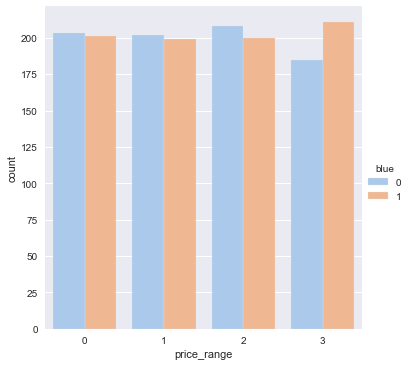

<Figure size 504x648 with 0 Axes>

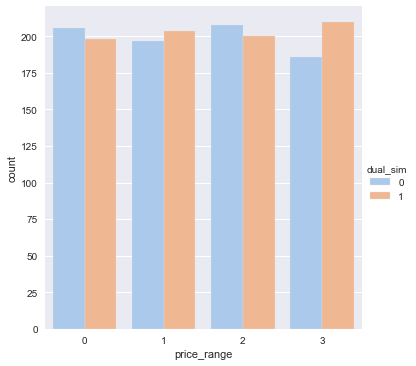

<Figure size 504x648 with 0 Axes>

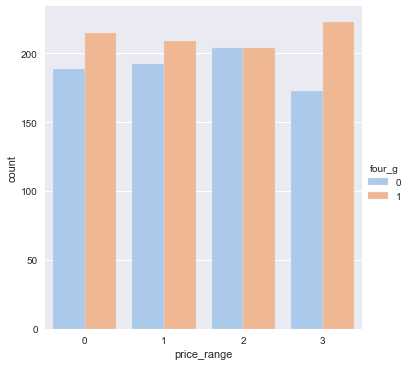

<Figure size 504x648 with 0 Axes>

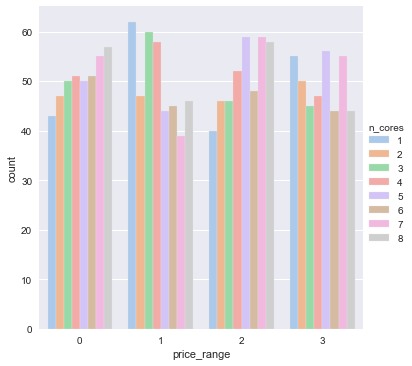

<Figure size 504x648 with 0 Axes>

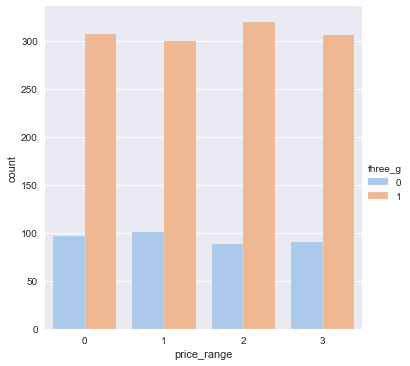

<Figure size 504x648 with 0 Axes>

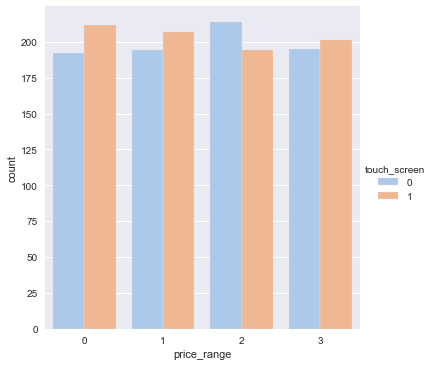

<Figure size 504x648 with 0 Axes>

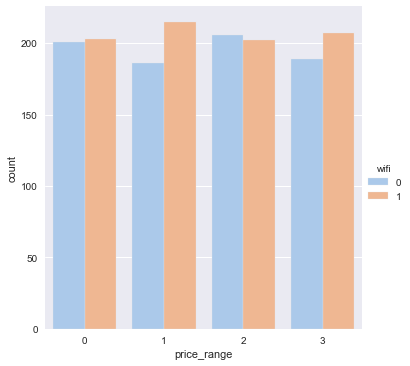

In [45]:
# checking categorical data count and price range with countplot
for i in range(0,7) :
    plt.figure(figsize=(7,9))
    sns.catplot(x="price_range", hue=cate_cols[i], kind="count",palette="pastel", edgecolor=".9",data=df)
    plt.show()

observation:

expensive mobile has bluetooth

if mobile has dual_sim card holder than price will be increased

Very expensive mobile provide 4 g facility

Very expensive mobile provide 3 g facility

# Checking numerical data

Text(0, 0.5, 'price_range')

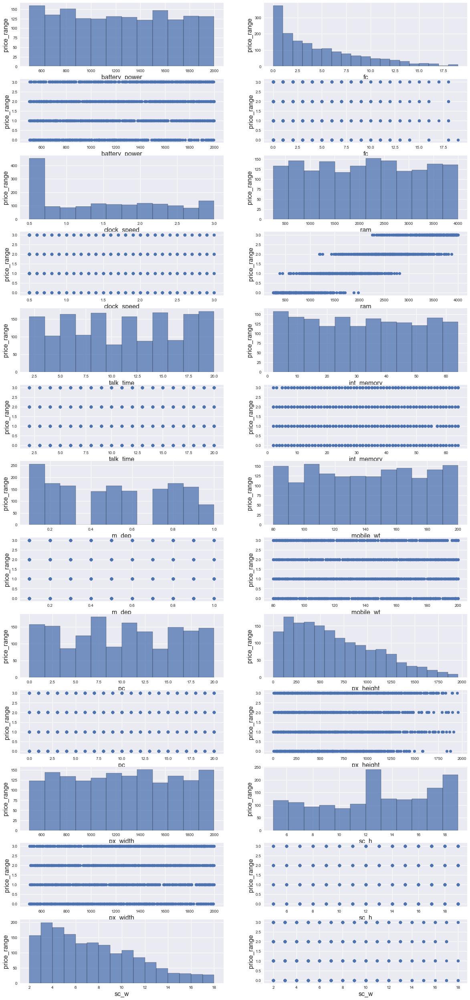

In [46]:
#Checking for noise with scatter plot
#Colsnum = ['battery_power','fc','clock_speed','ram','talk_time','int_memory','m_dep',
       #'mobile_wt','pc','px_height','px_width','sc_h','sc_w']
plt.figure(figsize=(20,45))

plt.subplot(13,2,1)
sns.histplot(df.battery_power)
plt.xlabel( 'battery_power', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,2)
sns.histplot(df.fc)
plt.xlabel( 'fc', fontsize=16)
plt.ylabel( 'price_range', fontsize=16) 

plt.subplot(13,2,3)
plt.scatter(df.battery_power, df['price_range'])
plt.xlabel( 'battery_power', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,4)
plt.scatter(df.fc, df['price_range'])
plt.xlabel( 'fc', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,5)
sns.histplot(df.clock_speed)
plt.xlabel( 'clock_speed', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,6)
sns.histplot(df.ram)
plt.xlabel( 'ram', fontsize=16)
plt.ylabel( 'price_range', fontsize=16) 

plt.subplot(13,2,7)
plt.scatter(df.clock_speed, df['price_range'])
plt.xlabel( 'clock_speed', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,8)
plt.scatter(df.ram, df['price_range'])
plt.xlabel( 'ram', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,9)
sns.histplot(df.talk_time)
plt.xlabel( 'talk_time', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,10)
sns.histplot(df['int_memory'])
plt.xlabel( 'int_memory', fontsize=16)
plt.ylabel( 'price_range', fontsize=16) 

plt.subplot(13,2,11)
plt.scatter(df.talk_time, df['price_range'])
plt.xlabel( 'talk_time', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)


plt.subplot(13,2,12)
plt.scatter(df['int_memory'], df['price_range'])
plt.xlabel( 'int_memory', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,13)
sns.histplot(df.m_dep)
plt.xlabel( 'm_dep', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,14)
sns.histplot(df['mobile_wt'])
plt.xlabel( 'mobile_wt', fontsize=16)
plt.ylabel( 'price_range', fontsize=16) 

plt.subplot(13,2,15)
plt.scatter(df.m_dep, df['price_range'])
plt.xlabel( 'm_dep', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)


plt.subplot(13,2,16)
plt.scatter(df['mobile_wt'], df['price_range'])
plt.xlabel( 'mobile_wt', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)


plt.subplot(13,2,17)
sns.histplot(df.pc)
plt.xlabel( 'pc', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,18)
sns.histplot(df['px_height'])
plt.xlabel( 'px_height', fontsize=16)
plt.ylabel( 'price_range', fontsize=16) 

plt.subplot(13,2,19)
plt.scatter(df.pc, df['price_range'])
plt.xlabel( 'pc', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)


plt.subplot(13,2,20)
plt.scatter(df['px_height'], df['price_range'])
plt.xlabel( 'px_height', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,21)
sns.histplot(df.px_width)
plt.xlabel( 'px_width', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,22)
sns.histplot(df['sc_h'])
plt.xlabel( 'sc_h', fontsize=16)
plt.ylabel( 'price_range', fontsize=16) 

plt.subplot(13,2,23)
plt.scatter(df.px_width, df['price_range'])
plt.xlabel( 'px_width', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)


plt.subplot(13,2,24)
plt.scatter(df['sc_h'], df['price_range'])
plt.xlabel( 'sc_h', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,25)
sns.histplot(df['sc_w'])
plt.xlabel( 'sc_w', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)

plt.subplot(13,2,26)
plt.scatter(df.sc_w, df['price_range'])
plt.xlabel( 'sc_w', fontsize=16)
plt.ylabel( 'price_range', fontsize=16)


observation:

dataset have not noise

RAM size increases Price of the Mobile Increases. and there are a relation between RAM and Price Range

In 0 class(low cost) Ram values are changing between 0- 2000 megabytes

In 1 class(medium cost) Ram values are changing between 0-3000 megabytes

In 2 class(high cost) Ram values are changing between 1000-4000 mb

In 3 class(very high cost) Ram values are changing between 2000 and 4000 mb( mostly 3500-4000 mb)

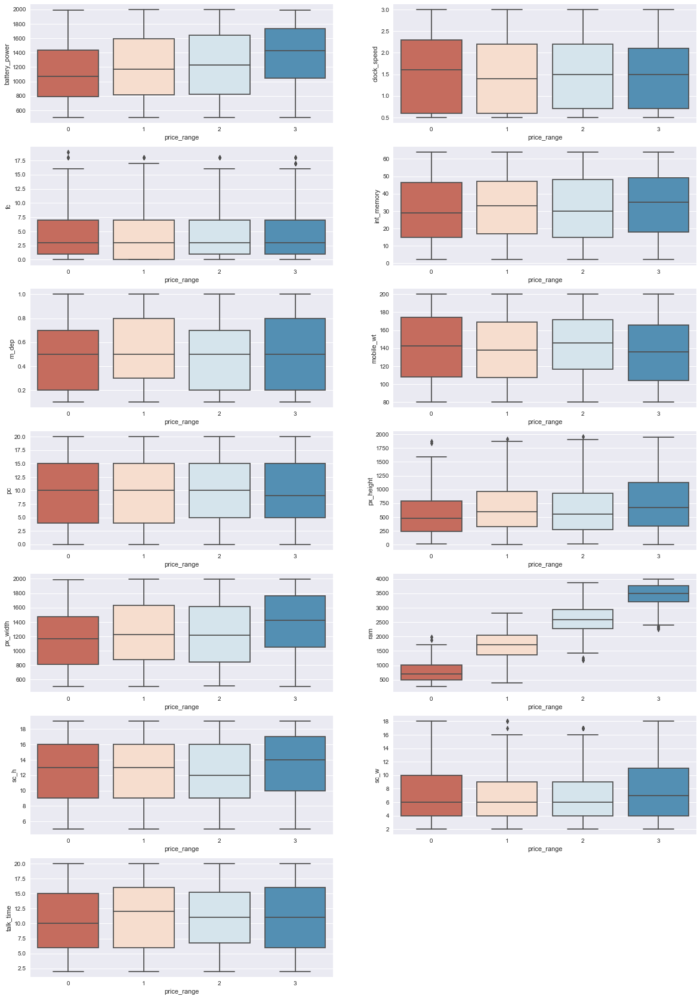

In [47]:
# checking numerical data count
nume_cols=['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt',
           'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']

fig=plt.figure(figsize=(20,30))
for i,col in enumerate(nume_cols):
    ax=fig.add_subplot(7,2,i+1)
    sns.boxplot(y=df[col],x=df['price_range'], palette = "RdBu")

observation:

very expensive mobile has higher memory

very expensive mobile has higher batry power

Compartively thick mobile has lower price and very thin mobile is much expensive

Low priced mobile can be less weighted because it doesn't have as many equipment as a expensive mobile does such as Large bettery, cameras.

Primary camera is one of the indicator or reason of the mobile price

Maximum Talk time found in low to medium price range.

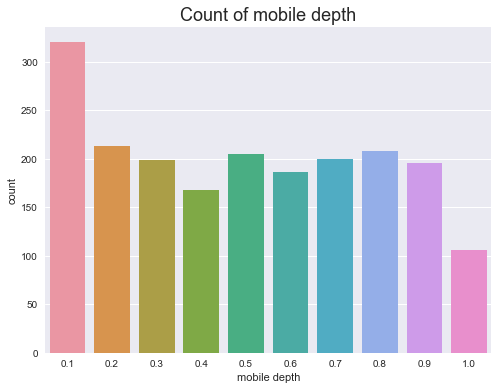

In [48]:
#Count of mobile depth
plt.figure(figsize=(8,6))
sns.countplot(data['m_dep'] , data=df)
plt.title("Count of mobile depth",size=18)
plt.xlabel('mobile depth')
plt.show()

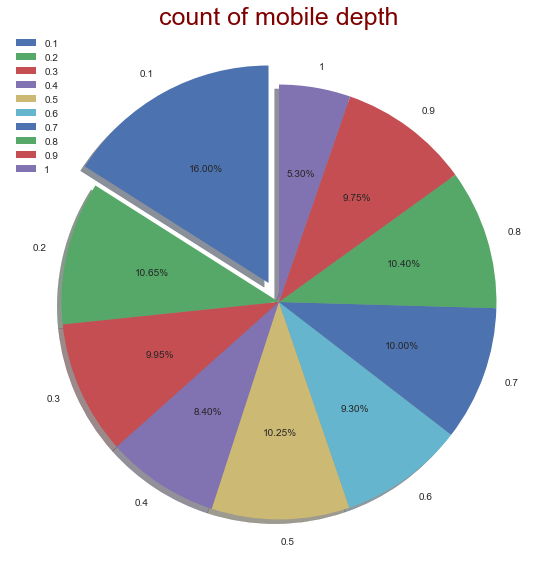

In [49]:
m_dep_label = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1 ]
m_dep_size = [320,213,199,168,205,186,200,208,195,106]
m_dep_explode = (0.1,0,0,0,0,0,0,0,0,0)

plt.figure(figsize=(13,10))
plt.pie( m_dep_size , explode=m_dep_explode , labels=m_dep_label ,shadow=True ,
        autopct='%1.2f%%' , startangle=90 )
plt.title("count of mobile depth",fontsize=25,color='maroon')
plt.legend()

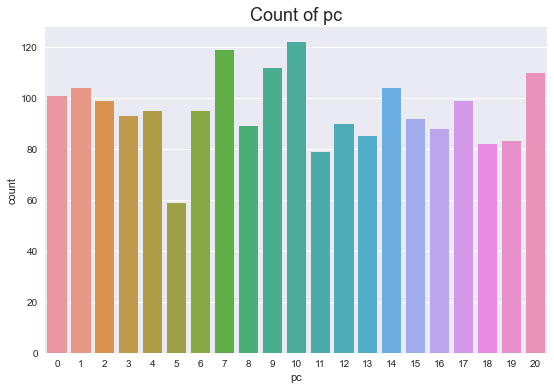

In [50]:
#Count of pc
plt.figure(figsize=(9,6))
sns.countplot(data['pc'] , data=df)
plt.title("Count of pc",size=18)
plt.xlabel('pc')
plt.show()

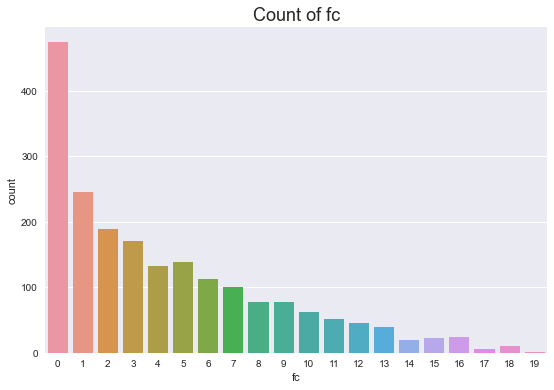

In [51]:
#Count of fc
plt.figure(figsize=(9,6))
sns.countplot(data['fc'] , data=df)
plt.title("Count of fc",size=18)
plt.xlabel('fc')
plt.show()

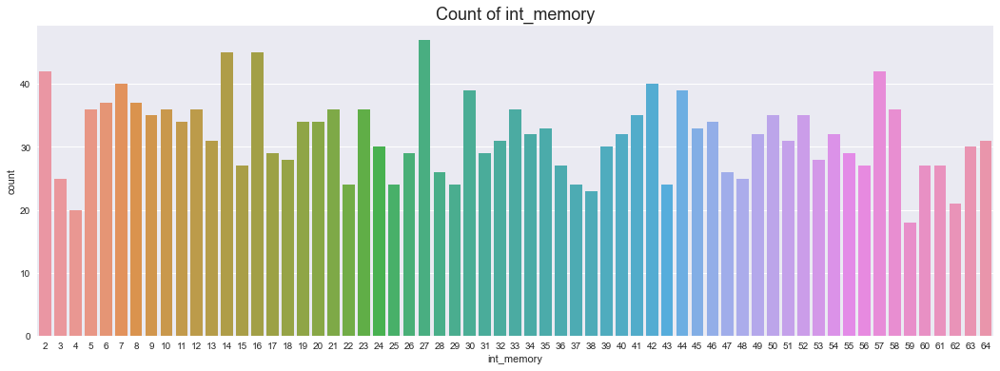

In [52]:
#Count of int_memory
plt.figure(figsize=(18,6))
sns.countplot(data['int_memory'] , data=df)
plt.title("Count of int_memory",size=18)
plt.xlabel('int_memory')
plt.show()

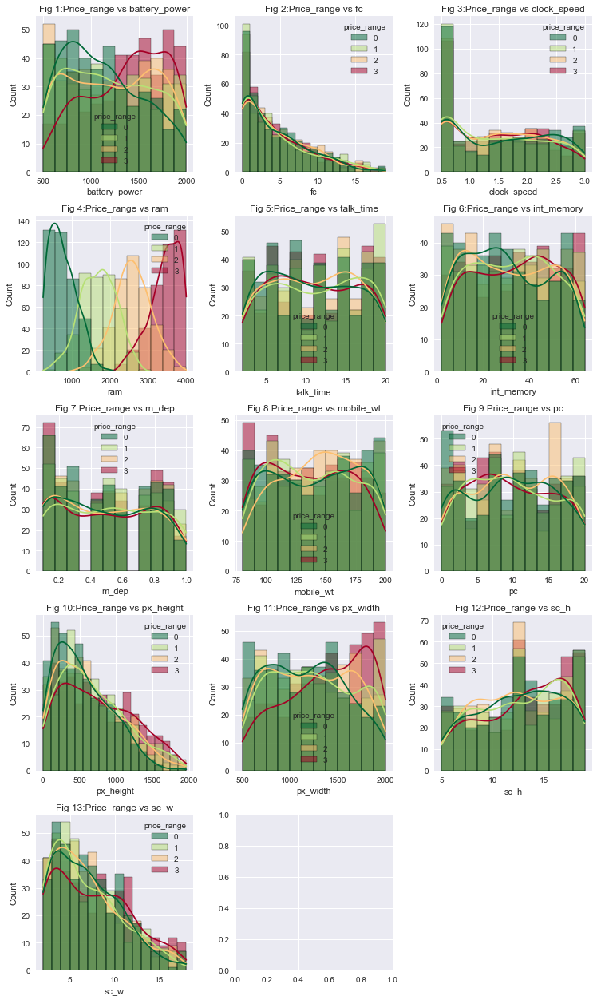

In [53]:
#vis for numerical type
nume_cols = ['battery_power','fc','clock_speed','ram','talk_time','int_memory','m_dep',
       'mobile_wt','pc','px_height','px_width','sc_h','sc_w']
n_rows=5
n_cols=3
fig,ax = plt.subplots(n_rows, n_cols, figsize=(n_cols*3.5,n_rows*3.5))

for r in range (0,n_rows):
    for c in range(0,n_cols):
        idx = r*n_cols + c #index loop through list 
        if idx <len(nume_cols):
            ax_idx = ax[r,c]
            sns.histplot(data=df, x=nume_cols[idx],hue ='price_range',kde='true'
                         ,palette='RdYlGn_r',ax=ax_idx)
            ax_idx.set_title(f"Fig {idx+1}:Price_range vs {nume_cols[idx]}")
ax.flat[-1].set_visible(False) # remove subplot doesn't use 
plt.tight_layout()
plt.show() 

observation

Cell phones belonging to the group with a price range of 0 are widely distributed on the side with low battery power.

Cell phones belonging to a group with a price range of 3 are widely distributed on the side with high battery power.

Battery power is relatively evenly distributed for cell phones belonging to the group with price range 1 and 2.

RAM size increases Price of the Mobile

Most of the values of clock speed are distributed between 0.5 and 0.6.

The higher the Pixel height, the smaller the number of cell phones. 

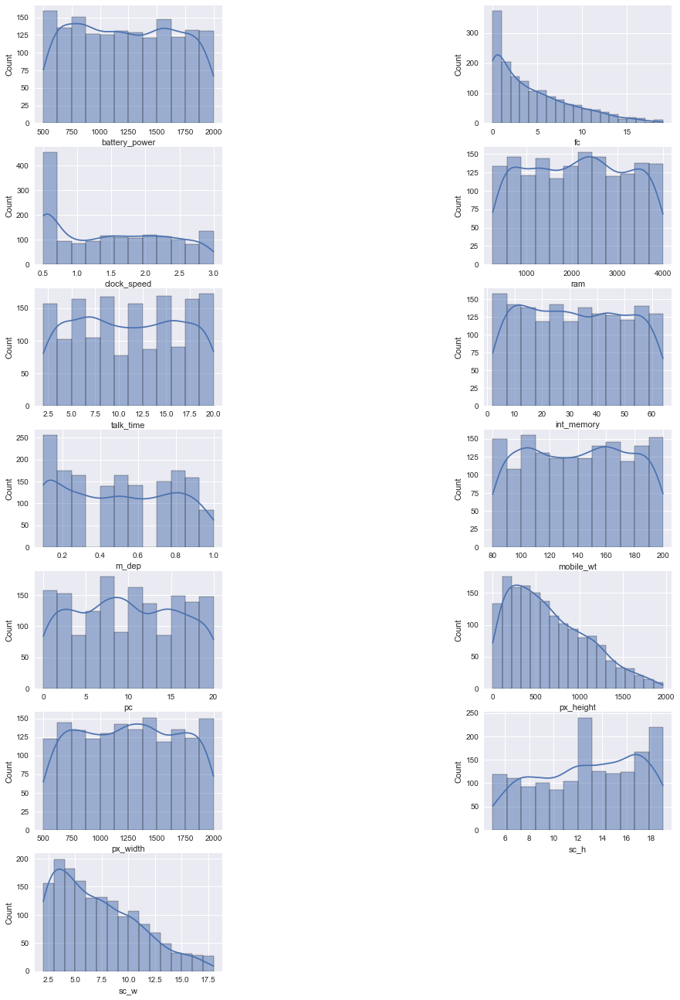

In [54]:
##Checking distributions of numerical data
fig = plt.figure(figsize = (20,60));
for index, feature in enumerate(nume_cols):
    plt.subplot(18, 4, index*2+1);
    sns.histplot(df[feature], kde = True);
plt.show();


In [55]:
df_group=df.copy()

In [56]:
battery_gp = []

for i in df_group["battery_power"]:
    if 500 < i <= 1000:
        battery_gp.append("low")
    elif 1000 < i <= 1500:
        battery_gp.append("medium")
    else:
        battery_gp.append("high")

df_group["battery_group"] = battery_gp

In [57]:
px_gp = []

for i in df_group["px_height"]:
    if 0 <= i <= 500:
        px_gp.append("under_500")
    elif 500 < i <= 1000:
        px_gp.append("under_1000")
    elif 1000 < i <= 1500:
        px_gp.append("under_1500")
    elif 1500 < i:
        px_gp.append("over_1500")
        
df_group["px_group"] = px_gp

In [58]:
memory_gp = []

for i in df_group["int_memory"]:
    if 0 < i <= 20:
        memory_gp.append("low_memory")
    elif 20 < i <= 40:
        memory_gp.append("medium_memory")
    elif 40 < i :
        memory_gp.append("high_memory")
        
df_group["memory_group"] = memory_gp

In [59]:
px_gp_2 = []

for i in df_group["px_height"]:
    if 0 <= i <= 1000:
        px_gp_2.append("under_1000")
    elif 1000 < i <= 1500:
        px_gp_2.append("under_1500")
    elif 1500 < i :
        px_gp_2.append("over_1500")
        
df_group["px_group_2"] = px_gp_2

In [60]:
ram_gp = []

for i in df_group["ram"]:
    if 0 < i <= 1500:
        ram_gp.append("low_ram")
    elif 1500 < i <= 2500:
        ram_gp.append("medium_ram")
    elif 2500 < i :
        ram_gp.append("high_ram")
        
df_group["ram_group"] = ram_gp

In [61]:
fc_gp = []

for i in df_group["fc"]:
    if 0 <= i <= 5:
        fc_gp.append("under_5")
    elif 5 < i <= 10:
        fc_gp.append("under_10")
    elif 10 < i <= 15:
        fc_gp.append("under_15")
    elif 15 < i:
        fc_gp.append("over_15")
df_group["fc_group"] = fc_gp

In [62]:
speed_gp = []

for i in df_group["clock_speed"]:
    if 0 < i <= 1:
        speed_gp.append("less_1")
    elif 1 < i <= 2:
        speed_gp.append("less_2")
    else:
        speed_gp.append("lees_3")
df_group["speed_group"] = speed_gp

In [63]:
df2=df_group[["battery_group", "px_group", "memory_group", "px_group_2", "ram_group","fc_group","speed_group", 'price_range']]
df2

,battery_group,px_group,memory_group,px_group_2,ram_group,fc_group,speed_group,price_range
0,low,under_500,low_memory,under_1000,high_ram,under_5,lees_3,1
1,medium,under_1000,high_memory,under_1000,high_ram,under_5,less_1,2
2,low,under_1500,high_memory,under_1500,high_ram,under_5,less_1,2
3,low,under_1500,low_memory,under_1500,high_ram,under_5,lees_3,2
4,high,under_1500,high_memory,under_1500,low_ram,under_15,less_2,1
5,high,under_500,low_memory,under_1000,high_ram,under_5,less_2,3
6,high,under_1000,medium_memory,under_1000,low_ram,under_5,less_1,0
7,low,under_1500,low_memory,under_1500,low_ram,under_5,less_1,0
8,low,under_500,low_memory,under_1000,high_ram,under_5,lees_3,3
9,high,under_500,medium_memory,under_1000,high_ram,under_5,lees_3,3


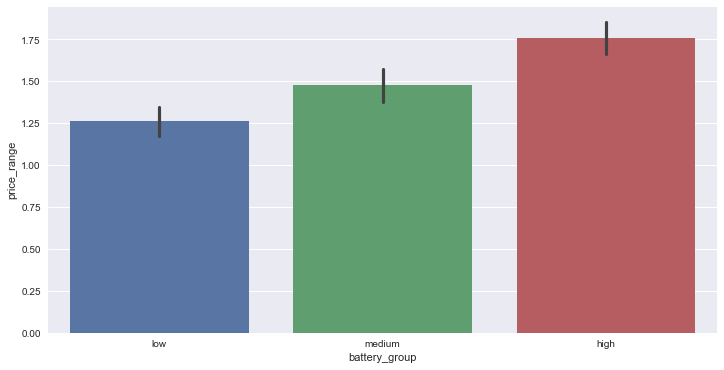

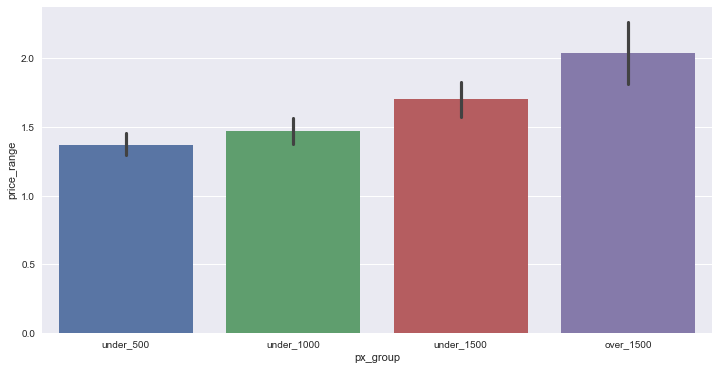

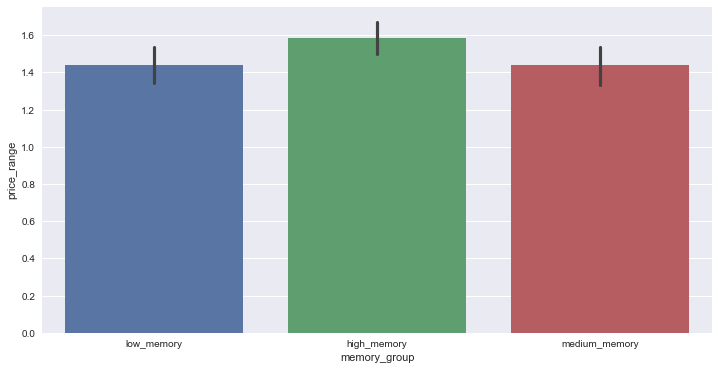

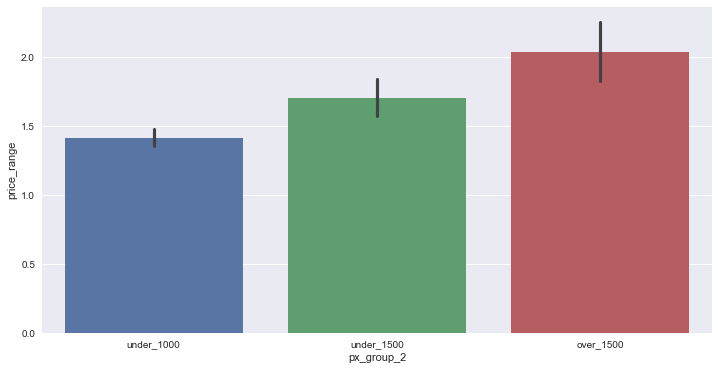

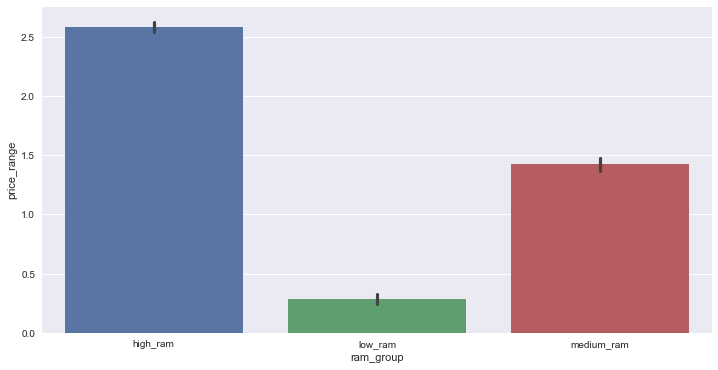

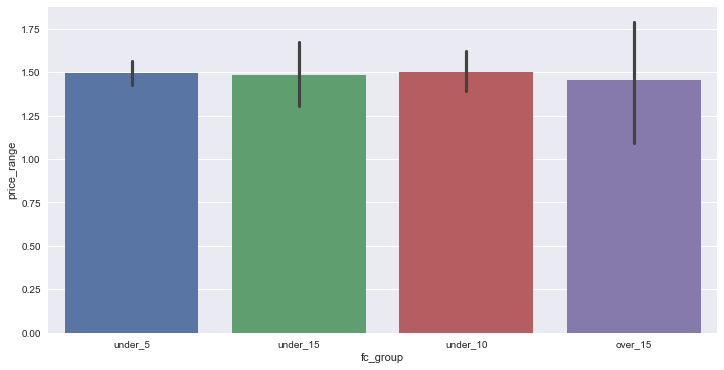

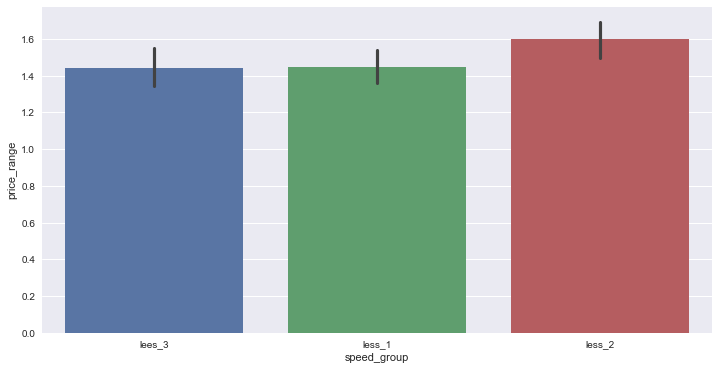

In [64]:
for i in range(7):
    fig = plt.figure(figsize = (12,6))
    sns.barplot(y = 'price_range', x = df2.columns[i], data = df2)

observation;

When battery power is divided into groups, unlike the number, the higher the power, the higher the price

the most expensive phones are those with a Pixel resolution value of more than 1500.

the most expensive phones are those with higher the memory.

the most expensive phones are those with higher the RAM.

There is little difference in cell phone prices according to the quality of the front camera.

Cell phones that clock speed is less than 2 are the most expensive.

# RAM- PRICE RANGE

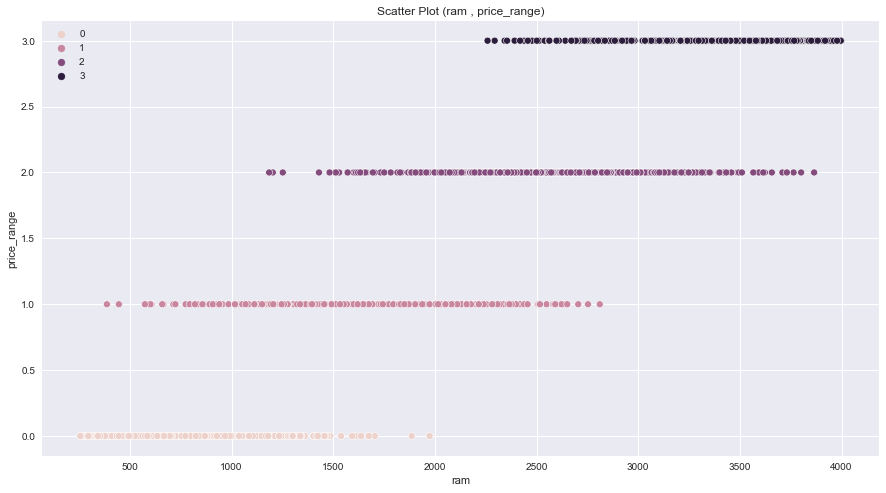

In [65]:
# we will analysise ram with price range
def scatter_plot(x , y , hue , data):
    plt.figure(1 , figsize = (15,8))
    sns.scatterplot(x = x , y = y , hue = hue , data = df)
    plt.legend()
    plt.title('Scatter Plot ({} , {})'.format(x , y))
    plt.show()
scatter_plot(x = 'ram' , y = 'price_range' , hue = 'price_range' , data = df)

<Figure size 864x720 with 0 Axes>

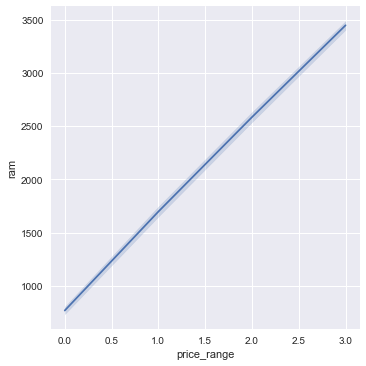

In [66]:
plt.figure(figsize=(12,10))
sns.relplot(x = 'price_range',y = 'ram',data = df,kind = 'line')

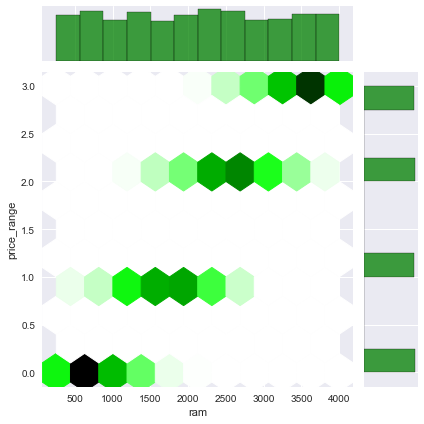

In [67]:
sns.jointplot(x='ram',y='price_range',data=df,color='green',kind='hex');

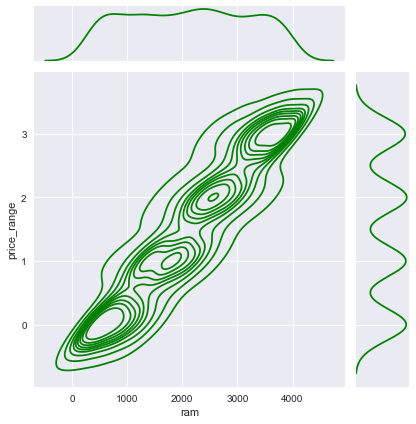

In [68]:
sns.jointplot(x='ram',y='price_range',data=df,color='green',kind='kde');

Observation

Here we can clearly visualize the relation between RAM and Price Range. as RAM size increases Price of the Mobile Increases.

# 4G-RAM- PRICE RANGE

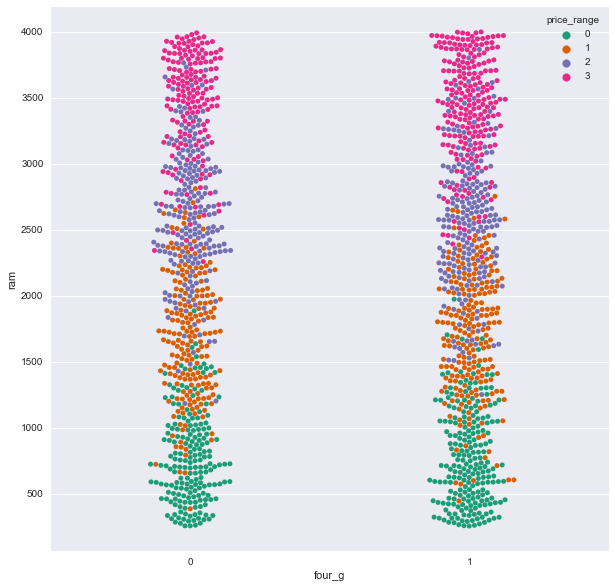

In [69]:
f, ax = plt.subplots(figsize=(10, 10))
ax=sns.swarmplot(x="four_g", y="ram", hue="price_range",
              palette="Dark2", data=df)
ax=sns.set(style="darkgrid")

# 3G-RAM and Price Range

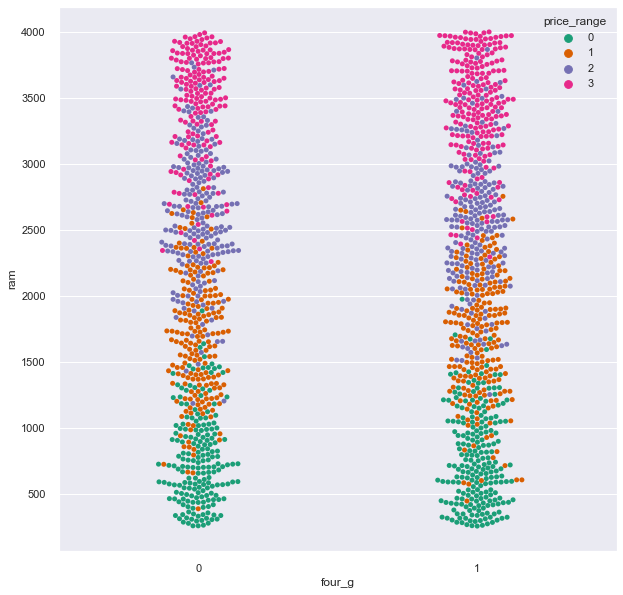

In [70]:
f, ax = plt.subplots(figsize=(10, 10))
ax=sns.swarmplot(x="four_g", y="ram", hue="price_range",
              palette="Dark2", data=df)
ax=sns.set(style="darkgrid")

# Battery power-RAM and Price Range

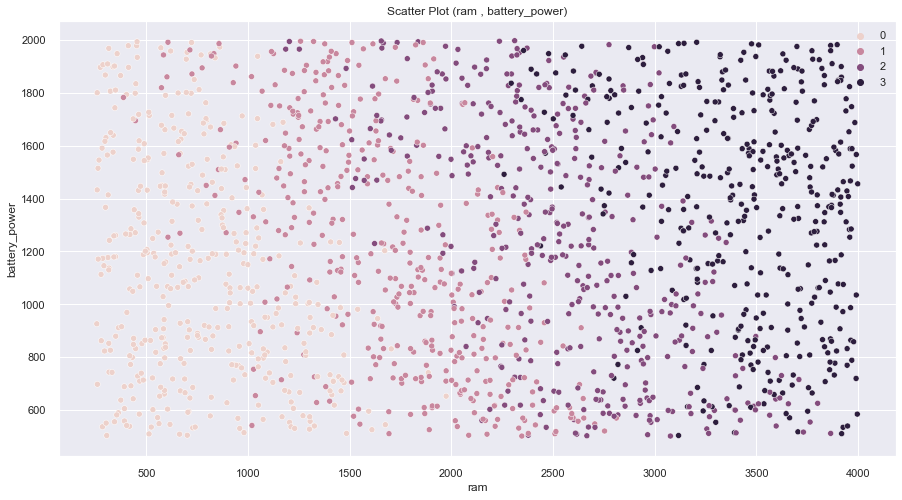

In [71]:
#compare battery power with RAM       
scatter_plot(x = 'ram' , y = 'battery_power' , hue = 'price_range' , data = df)

# observation:

mobile phone with RAM more than 3000 have a higher price

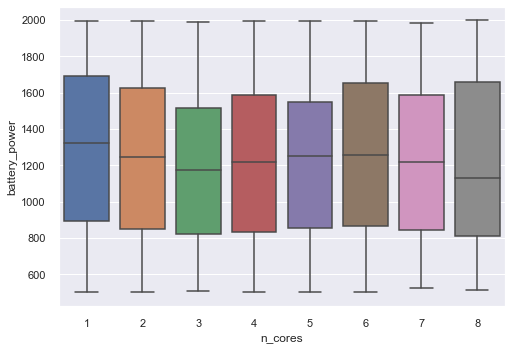

In [72]:
#compare battery power with n_cores
sns.boxplot(data=df, x=df['n_cores'], y=df['battery_power']);

# Camera mega pixels 

Text(0.5, 0, 'MegaPixels')

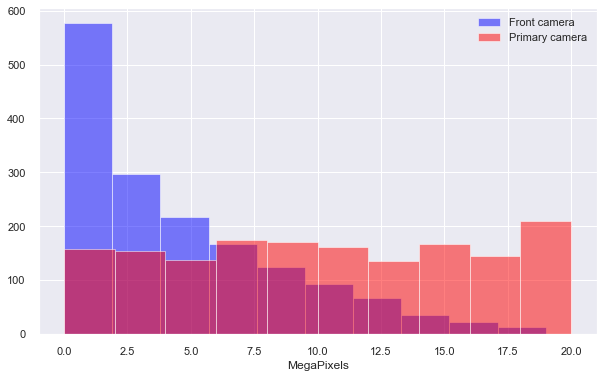

In [73]:
plt.figure(figsize=(10,6))
df['fc'].hist(alpha=0.5,color='blue',label='Front camera')
df['pc'].hist(alpha=0.5,color='red',label='Primary camera')
plt.legend()
plt.xlabel('MegaPixels')

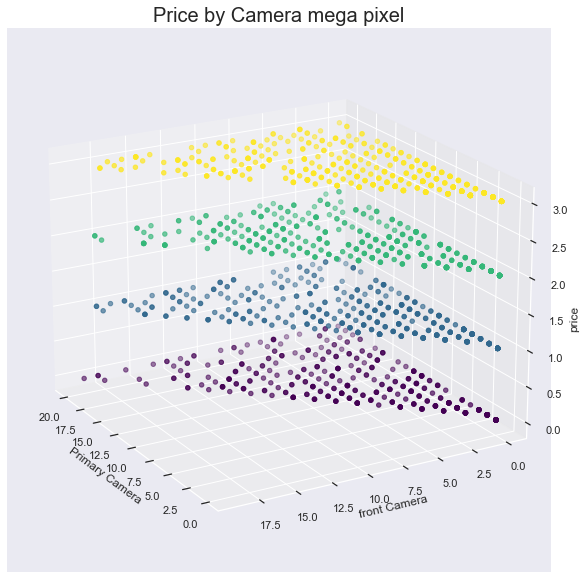

In [74]:
from matplotlib import animation 
ax = plt.figure(figsize=(10,10)).add_subplot(111, projection = '3d')

sns.set(style = "darkgrid")
x = df['pc']
y = df['fc']
z = df["price_range"]

ax.set_xlabel("Primary Camera")
ax.set_ylabel("front Camera")
ax.set_zlabel("price")
ax.set_title("Price by Camera mega pixel", fontsize=20)

ax.scatter(x, y, z, c=z ,cmap='viridis')
ax.view_init(elev=20, azim=150)

plt.show()

observation

There is no significant difference in the distribution of Camera mega pixel by price range.

# pixel resolution

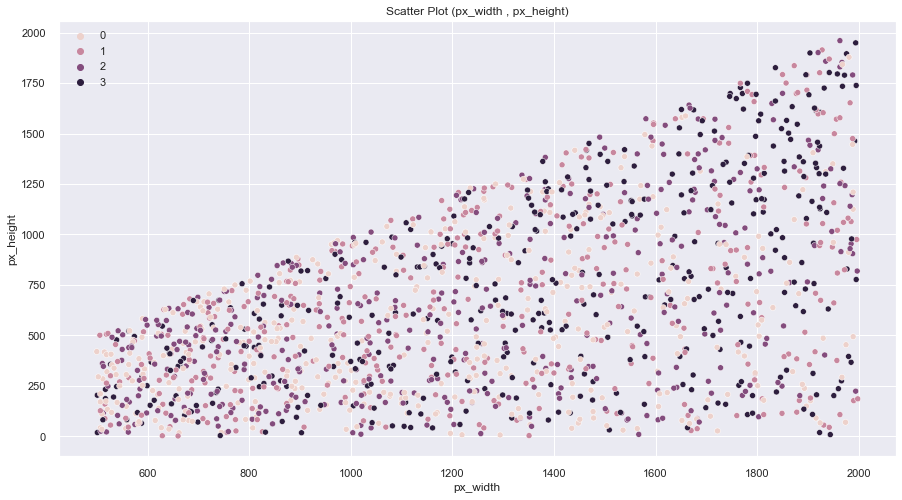

In [75]:
scatter_plot(x = 'px_width' , y = 'px_height' , hue = 'price_range' , data = df)

observation:

Here we can clearly visualize the relation between px-width and px-height. as px-width increases px-height of the Mobile Increases.

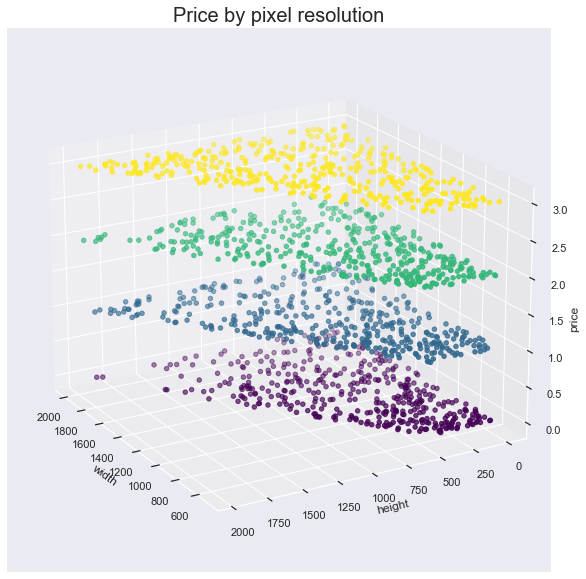

In [76]:
ax = plt.figure(figsize=(10,10)).add_subplot(111, projection = '3d')

sns.set(style = "darkgrid")
x = df['px_width']
y = df['px_height']
z = df["price_range"]

ax.set_xlabel("width")
ax.set_ylabel("height")
ax.set_zlabel("price")
ax.set_title("Price by pixel resolution", fontsize=20)

ax.scatter(x, y, z, c=z ,cmap='viridis')
ax.view_init(elev=20, azim=150)

plt.show()

observation

There is no significant difference in the distribution of pixel resolution by price range.

Phones with a price range of 3 have the highest density distributed on the side with high height and width.

# Screen Width & Height

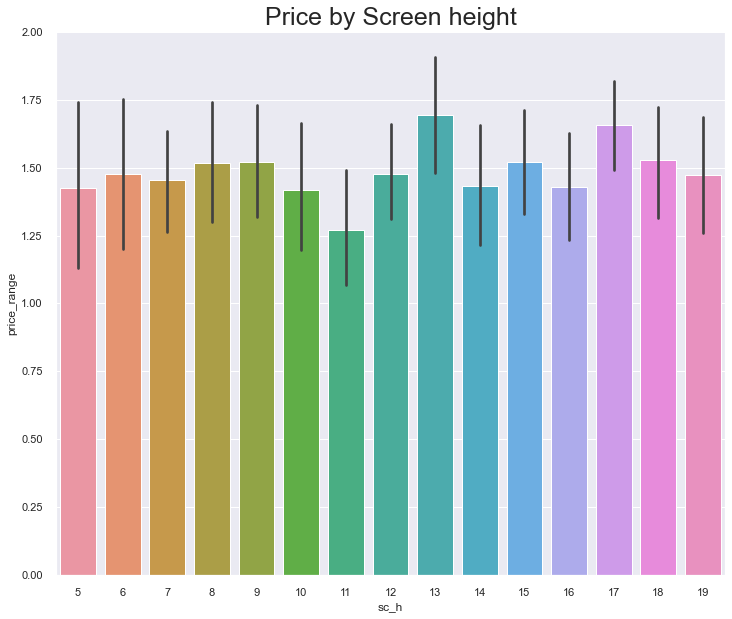

In [77]:
plt.figure(figsize=(12,10))
sns.barplot(x="sc_h", y="price_range", data=df)
plt.title("Price by Screen height", fontsize=25)
plt.show()

observation

There is no significant difference in price range according to screen height.

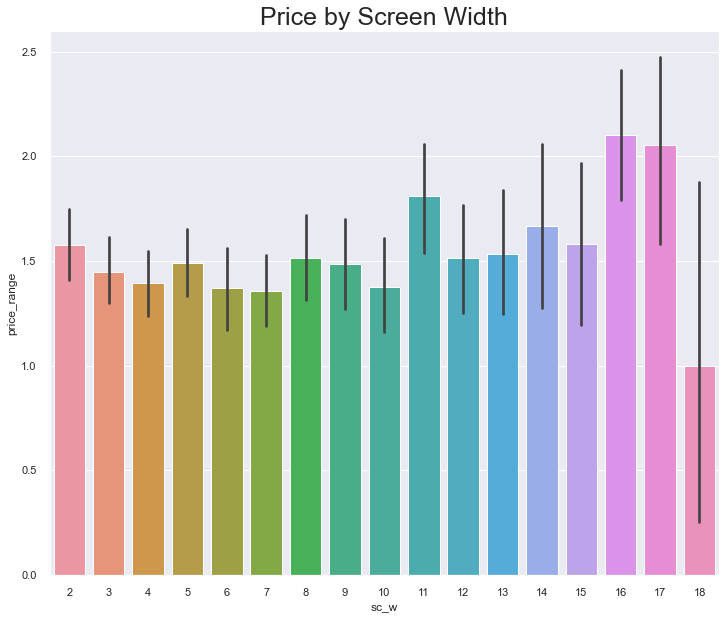

In [78]:
plt.figure(figsize=(12,10))
sns.barplot(x="sc_w", y="price_range", data=df)
plt.title("Price by Screen Width", fontsize=25)
plt.show()

observation

Cell phones with screen width of 16 and 17 are the most expensive.

Cell phones with screen width of 18 are significantly lower in value.

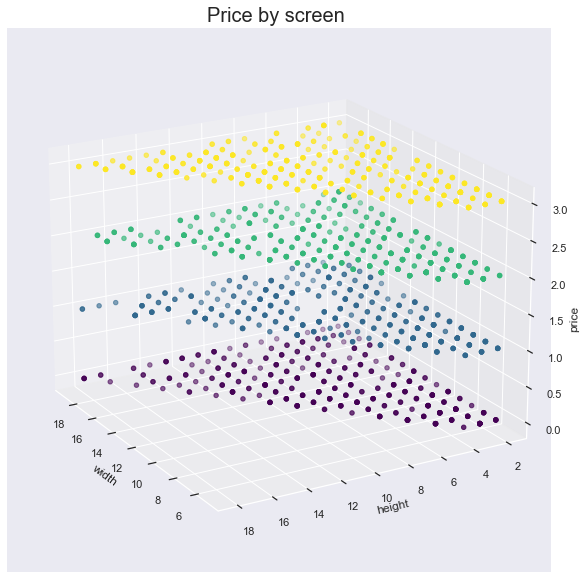

In [79]:
ax = plt.figure(figsize=(10,10)).add_subplot(111, projection = '3d')

sns.set(style = "darkgrid")
x = df['sc_h']
y = df['sc_w']
z = df["price_range"]

ax.set_xlabel("width")
ax.set_ylabel("height")
ax.set_zlabel("price")
ax.set_title("Price by screen ", fontsize=20)

ax.scatter(x, y, z, c=z ,cmap='viridis')
ax.view_init(elev=20, azim=150)

plt.show()

observation

The difference in price range according to screen width and height is not noticeable

In [80]:
target_grp = df.groupby(['price_range'])

In [81]:
target_grp.describe(percentiles = [0.5])[nume_cols]

battery_power                                                  \
                    count         mean         std    min     50%     max   
price_range                                                                 
0            404.0         1124.242574  412.085774  503.0  1067.0  1994.0   
1            401.0         1206.471322  444.024447  501.0  1172.0  1996.0   
2            408.0         1231.578431  454.630161  501.0  1225.0  1998.0   
3            396.0         1374.267677  410.192655  503.0  1431.0  1992.0   

                fc                                     clock_speed            \
             count      mean       std  min  50%   max       count      mean   
price_range                                                                    
0            404.0  4.183168  4.220488  0.0  3.0  19.0  404.0       1.549505   
1            401.0  4.269327  4.525735  0.0  3.0  18.0  401.0       1.468828   
2            408.0  4.436275  4.314521  0.0  3.0  18.0  408.0       1.524510   
3            396.0  4.285354  4.264886  0.0  3.0  18.0  396.0       1.491919   

                                        ram                                   \
                  std  min  50%  max  count         mean         std     min   
price_range                                                                    
0            0.846933  0.5  1.6  3.0  404.0  770.507426   350.690411  256.0    
1            0.816915  0.5  1.4  3.0  401.0  1698.137157  467.847137  387.0    
2            0.796946  0.5  1.5  3.0  408.0  2584.431373  494.065922  1185.0   
3            0.780513  0.5  1.5  3.0  396.0  3446.171717  398.742372  2259.0   

                            talk_time                                        \
                50%     max     count       mean       std  min   50%   max   
price_range                                                                   
0            709.5   1974.0  404.0     10.638614  5.435669  2.0  10.0  20.0   
1            1719.0  2811.0  401.0     11.314214  5.650754  2.0  12.0  20.0   
2            2580.0  3865.0  408.0     10.950980  5.377864  2.0  11.0  20.0   
3            3500.0  3998.0  396.0     11.017677  5.438465  2.0  11.0  20.0   

            int_memory                                         m_dep  \
                 count       mean        std  min   50%   max  count   
price_range                                                            
0            404.0      30.633663  17.975430  2.0  29.0  64.0  404.0   
1            401.0      32.867830  17.975956  2.0  33.0  64.0  401.0   
2            408.0      31.399510  18.574234  2.0  30.0  64.0  408.0   
3            396.0      34.345960  18.169776  2.0  35.0  64.0  396.0   

                                               mobile_wt              \
                 mean       std  min  50%  max     count        mean   
price_range                                                            
0            0.488119  0.284169  0.1  0.5  1.0  404.0     140.569307   
1            0.522943  0.289693  0.1  0.5  1.0  401.0     139.057357   
2            0.494363  0.288677  0.1  0.5  1.0  408.0     144.321078   
3            0.496717  0.293929  0.1  0.5  1.0  396.0     136.333333   

                                               pc                            \
                   std   min    50%    max  count       mean       std  min   
price_range                                                                   
0            36.921520  80.0  142.5  200.0  404.0  9.715347   6.119623  0.0   
1            35.540459  80.0  138.0  200.0  401.0  9.875312   6.023239  0.0   
2            33.716368  80.0  146.0  200.0  408.0  10.022059  5.908558  0.0   
3            35.136335  80.0  136.0  200.0  396.0  9.747475   5.921159  0.0   

                        px_height                                       \
              50%   max     count        mean         std   min    50%   
price_range                                                              
0         

observation

Values in th column "battery_power" is almost linearly correlated with the target classes.

Oddly, target class 0 has the highest mean value of "clock_speed" !

Highest mean value of "int_memory" belong to the target classes 3 .

Lowest mean value of "mobile_wt" belongs to the target class 3, and that sounds reasonable.

Column "pc" is linearly correlated with the target classes.

Highest mean value of "px_height" belongs to the target class 3.

Highest mean value of "px_width" belongs to the target class 3. That means, more expensive phones has better screen in terms of 
the pixel size.

Values in the column "ram" is highly and positively correlated with the target.
Mean value of "sc_h" is higher among samples of the target class 3. However, for other classes there is no logical relation.

# Correlation

<AxesSubplot:>

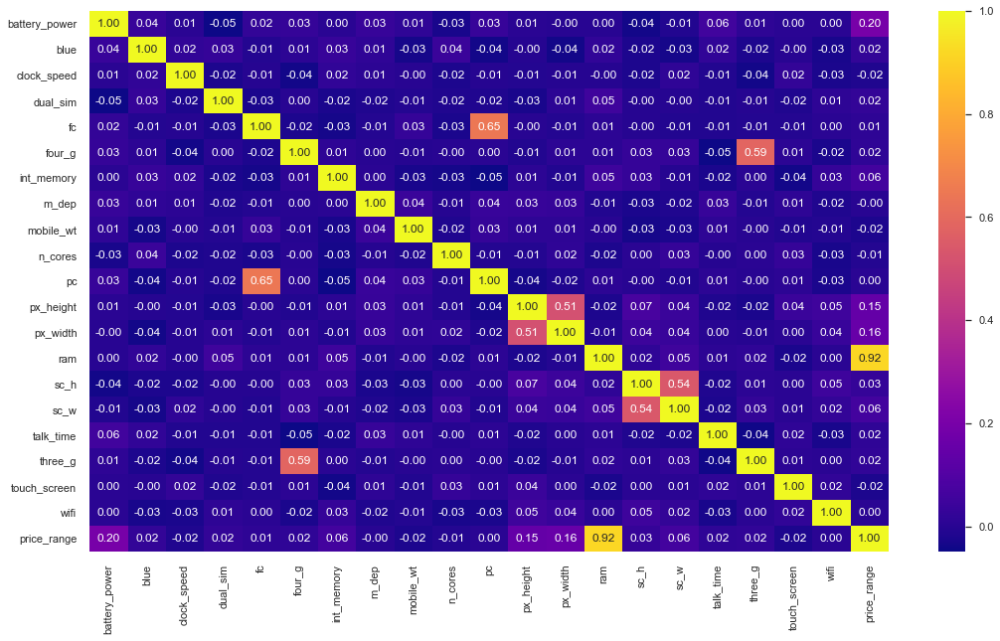

In [82]:
plt.figure(figsize = (18,10))
sns.heatmap(df.corr(), cmap= 'plasma',annot = True , fmt='.2f' )

In [84]:
# checking correlation of independent variable with dependent variable i.e personal_loan
df.corr()['price_range'].sort_values(ascending=False)

price_range      1.000000
ram              0.917330
battery_power    0.196288
px_width         0.155291
px_height        0.145118
int_memory       0.058975
sc_w             0.058899
sc_h             0.027184
dual_sim         0.022609
blue             0.022046
three_g          0.019767
talk_time        0.015909
four_g           0.015621
fc               0.012357
pc               0.004713
wifi             0.004313
m_dep           -0.000956
n_cores         -0.008647
clock_speed     -0.016139
touch_screen    -0.020838
mobile_wt       -0.022835
Name: price_range, dtype: float64

observtion from the heatmap:
As we can see our target price range has highly positive correlation between ram.

3G and 4G

pc(Primary Camera mega pixels) and fc(Front Camera mega pixels)

px_weight(Pixel Resolution Width) and px_height(Pixel Resolution Height)

sc_w(Screen Width of mobile in cm) and sc_h(Screen Height of mobile in cm)

features have highly positive correlation. For example as long as sc_w (screen width of mobile) increase, sc_h(screen height of mobile) is increasing. 

# Model Building

## DECISION TREE CLASSIFIER (DTs)

In [94]:
# independant variables
x=df.drop(["price_range"],axis=1)
y = df["price_range"].values.reshape(-1,1)  #target
print('shape of x : {} \nshape of y : {}'.format(x.shape , y.shape))

shape of x : (1609, 20) 
shape of y : (1609, 1)


In [95]:
# Returning the classification metrics for multi_class problem.

def Report(y_test , y_pred):
    print('Accuracy : {}% \n'.format(accuracy_score(y_test , y_pred)*100))
    print('Confusion Matrix : \n\n{}\n'.format(confusion_matrix(y_test , y_pred)))
    print('Classification Report : \n\n{}'.format(classification_report(y_test , y_pred)))
    
def multi_class_metrics(y_true, y_pred):
    print(f'Accuracy  : ', round(metrics.accuracy_score(y_true, y_pred), 3))
    print(f'Precision : ', round(metrics.precision_score(y_true, y_pred, average = 'micro'), 3))
    print(f'Recall    : ', round(metrics.recall_score(y_true, y_pred, average = 'micro'), 3))
    print(f'f1        : ', round(metrics.f1_score(y_true, y_pred, average = 'micro'), 3))

In [96]:
def DTs_Model(x, y, test_size, M_depth, Criterion):

    global x_train , x_test , y_train , y_test , y_pred
    
    rows = []
    
    for n in test_size:
        x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = n , random_state = 0)
        
        for maxDepth in M_depth:
            
            for c in Criterion:
                
                # Create Decision Tree classifer model
                DTs = DecisionTreeClassifier(max_depth = maxDepth, criterion=c)
            
                # fit model for train data
                DTs = DTs.fit(x_train,y_train) 
                #Predict the response for test dataset
                y_pred = DTs.predict(x_test)
        
                dataset = {'Test_size': n, 'Max_depth': maxDepth, 'Criterion':c , 'acc': metrics.accuracy_score(y_test, y_pred), 'score': DTs.score(x, y)}
                rows.append(dataset)
                evaluation = pd.DataFrame(rows) 
            
                       
            
    return (evaluation)   
# We want to hightlight the maximume values
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: green' if v else '' for v in is_max]

In [97]:
evaluation = DTs_Model(x, y, [0.1, 0.15, 0.2, 0.25,0.3], np.arange(1, 20),['gini', 'entropy'])
evaluation.style.apply(highlight_max) 

,Test_size,Max_depth,Criterion,acc,score
0,0.100000,1,gini,0.521739,0.497203
1,0.100000,1,entropy,0.521739,0.497203
2,0.100000,2,gini,0.776398,0.766314
3,0.100000,2,entropy,0.770186,0.766314
4,0.100000,3,gini,0.788820,0.775637
5,0.100000,3,entropy,0.770186,0.766314
6,0.100000,4,gini,0.832298,0.838409
7,0.100000,4,entropy,0.826087,0.817278
8,0.100000,5,gini,0.819876,0.882536
9,0.100000,5,entropy,0.795031,0.875078


test size=0.1
max_depth=14
Criterion= gini

In [98]:
#split X and y in training and test set in 90:10 ratio
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.1 , random_state = 0)
print('shape of x_train :',x_train.shape)
print('shape of y_train :',y_train.shape)
print('shape of x_test :',x_test.shape)
print('shape of y_test :',y_test.shape)

shape of x_train : (1448, 20)
shape of y_train : (1448, 1)
shape of x_test : (161, 20)
shape of y_test : (161, 1)


In [99]:
DTs = DecisionTreeClassifier(max_depth =14, criterion='gini',random_state = 0)
DTs = DTs.fit(x_train,y_train)
y_pred = DTs.predict(x_test) 

## Evaluation

In [100]:
Report(y_test , y_pred) 

Accuracy : 84.472049689441% 

Confusion Matrix : 

[[35  5  0  0]
 [ 3 29  6  0]
 [ 0  7 30  2]
 [ 0  0  2 42]]

Classification Report : 

              precision    recall  f1-score   support

           0       0.92      0.88      0.90        40
           1       0.71      0.76      0.73        38
           2       0.79      0.77      0.78        39
           3       0.95      0.95      0.95        44

    accuracy                           0.84       161
   macro avg       0.84      0.84      0.84       161
weighted avg       0.85      0.84      0.85       161



In [101]:
print('f1 score is:', metrics.f1_score(y_test, y_pred,average="macro"))

f1 score is: 0.8413448365980011


In [106]:
!pip install yellowbrick 

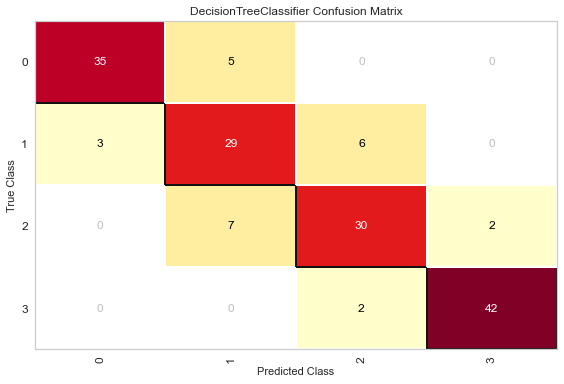

<AxesSubplot:title={'center':'DecisionTreeClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [107]:
from yellowbrick.classifier import ConfusionMatrix

cm = ConfusionMatrix(
    DTs, classes=[0,1,2,3])


cm.fit(x_train, y_train)
cm.score(x_test, y_test)

cm.poof()

DTs model predict 42+30+29+35= 136 samples correctly.

DTs model predict 2+2+7+6+3+5= 25 samples uncorrectly. 

### use cross validation

In [108]:
def Perform_cross_val(model, k, x, y, scoring):
    """
    perform cross validation
        model: model
        k(scaler): the value for n_splits in KFold()
        x(DataFrame or array):  x_train
        y(DataFrame or array): y_train
        scoring(string): an approach for evaluation in cross validation
    """

    kf = StratifiedKFold(n_splits=k)
    cv_results = cross_val_score(model, x, y.ravel(), cv=kf, scoring=scoring)
    cv_mean = np.mean(cv_results)
    
    print('-'*20, f"CV for k={k}, scoring={scoring}", '-'*20)
    print(f"CV mean: {cv_mean}")
    print(f"CV results: {cv_results}\n")

In [109]:
# Check cross validation on DTs model to estimate model performance (Accuracy)
# use MinMaxScaler 
pipe1 = Pipeline([('scaler', MinMaxScaler()), ('DTs', DecisionTreeClassifier())])
Perform_cross_val(pipe1, k=5, x=x_train, y=y_train, scoring='accuracy')

-------------------- CV for k=5, scoring=accuracy --------------------
CV mean: 0.8183772819472616
CV results: [0.81724138 0.80689655 0.82068966 0.80968858 0.83737024]



scores of all fold are good.

## MODEL WITH GRIDSEARCHCV

To apply DTs algorithm firstly I used GridSearchCV method to tune parameters. Some parameters are given below.

In [110]:
#split X and y in training and test set in 90:10 ratio
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.1 , random_state = 0)

In [111]:
DTs2 = DecisionTreeClassifier()

In [112]:
max_depth = range(2,21,1)
criterion = ['entropy', 'gini']
min_samples_leaf:range(1,15,1)
min_samples_split:range(2,20,1)     
random_state =range(0,1)

parameters = {'max_depth': max_depth , 'criterion':criterion ,"min_samples_leaf":range(1,15,1),
              "min_samples_split":range(2,20,1),'random_state':random_state}
gridsearch = GridSearchCV(estimator = DTs2,
                         param_grid = parameters,
                         scoring = 'accuracy',
                         cv = 5,
                         verbose = 1,
                         n_jobs = -1)
gridsearch.fit(x_train,y_train)

Fitting 5 folds for each of 9576 candidates, totalling 47880 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(2, 21),
                         'min_samples_leaf': range(1, 15),
                         'min_samples_split': range(2, 20),
                         'random_state': range(0, 1)},
             scoring='accuracy', verbose=1)

In [113]:
print(gridsearch.best_params_)

{'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 7, 'min_samples_split': 16, 'random_state': 0}


Now lets build the model with the best parameters we have found with the Gridsearch method.

In [114]:
DTs2 = DecisionTreeClassifier(criterion='gini', max_depth= 9, min_samples_leaf= 7, min_samples_split= 16, random_state= 0)
DTs2 = DTs2.fit(x_train,y_train)
y_pred = DTs2.predict(x_test)

In [115]:
Report(y_test , y_pred)

Accuracy : 88.19875776397515% 

Confusion Matrix : 

[[37  3  0  0]
 [ 4 32  2  0]
 [ 0  7 31  1]
 [ 0  0  2 42]]

Classification Report : 

              precision    recall  f1-score   support

           0       0.90      0.93      0.91        40
           1       0.76      0.84      0.80        38
           2       0.89      0.79      0.84        39
           3       0.98      0.95      0.97        44

    accuracy                           0.88       161
   macro avg       0.88      0.88      0.88       161
weighted avg       0.89      0.88      0.88       161



In [116]:
print('f1 score is:', metrics.f1_score(y_test, y_pred,average="macro"))

f1 score is: 0.8792338315326821


Score of model increased after using Grid search CV parameters 

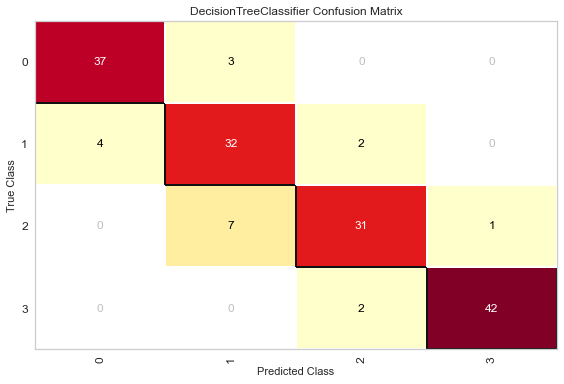

<AxesSubplot:title={'center':'DecisionTreeClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [118]:
from yellowbrick.classifier import ConfusionMatrix

cm = ConfusionMatrix(
    DTs2, classes=[0,1,2,3])


cm.fit(x_train, y_train)
cm.score(x_test, y_test)

cm.poof()

DTs2 model predict 42+31+32+37= 142 samples correctly.

DTs2 model predict 2+2+7+6+3+5= 19 samples incorrectly. 

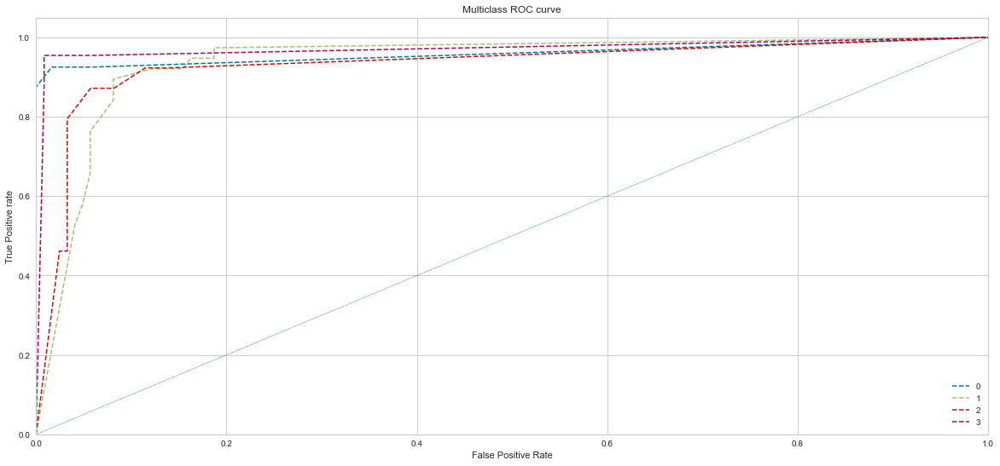

In [119]:
y_Pred_prob = DTs2.predict_proba(x_test)
def roc_curve_plot(y_actual , y_predicted_probs):
    
    fpr = {}
    tpr = {}
    thres = {}
    roc_auc = dict()

    n_class = np.unique(y_actual).shape[0]
    y_lb = label_binarize(y_test , classes = np.unique(y_actual))

    plt.figure(1 , figsize = (20 , 9))
    for i in range(n_class):
        fpr[i] , tpr[i] , thres[i] = roc_curve(y_lb[: , i] , y_predicted_probs[: , i])
        plt.plot(fpr[i] , tpr[i] , '--' , linewidth = 1.5,  label = '{}'.format(i))
    
    plt.plot([0 , 1] , [0 ,1] , 'b--' , linewidth = 0.5)
    plt.xlim([0 , 1])
    plt.ylim([0 , 1.05])
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='lower right')
    plt.show()
    
roc_curve_plot(y_test , y_Pred_prob) 

Best Decision Tree : DTs2

Hyperparameters : criterion='gini', max_depth= 9, min_samples_leaf= 7, min_samples_split= 16, random_state= 0

Accuracy = 88.20%

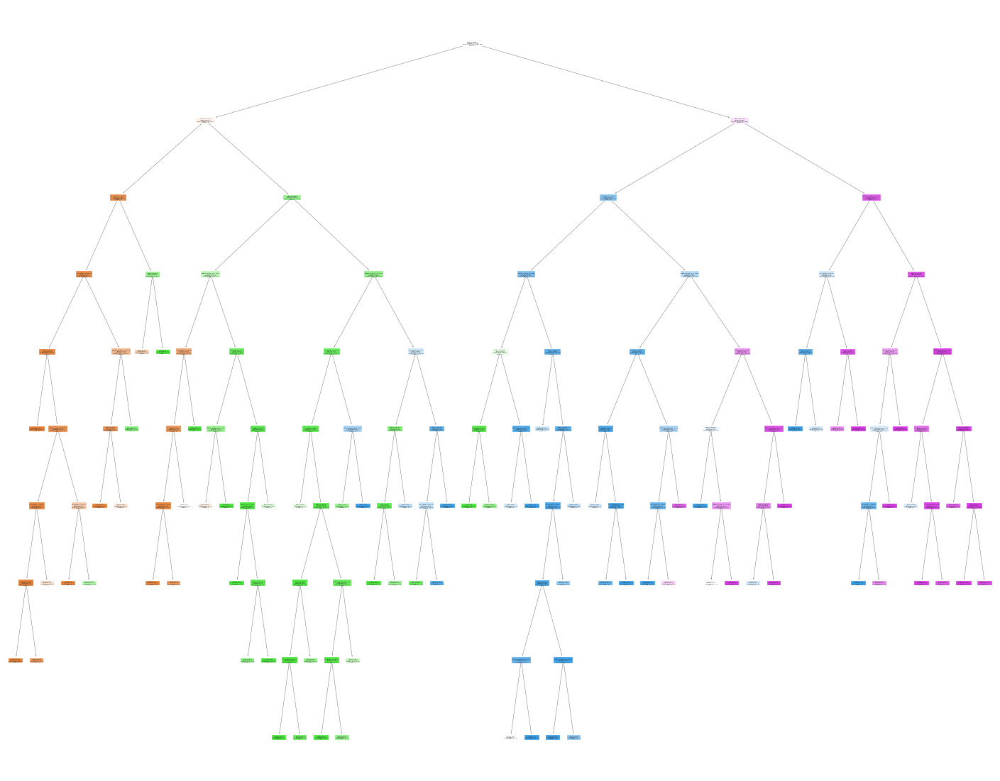

In [120]:
# visualizing tree
from sklearn import tree
feature_names = x.columns
target_names = ['0', '1','2','3']
fig = plt.figure(figsize=(25,20))
plot= tree.plot_tree (DTs2,
                     feature_names=feature_names,
                     class_names=target_names,
                     filled=True) 
plt.show()

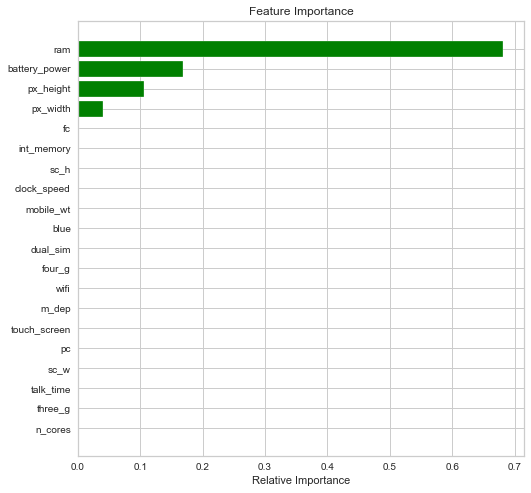

In [121]:
importances = DTs2.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8,8))
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# RANDOM FOREST (RF) 

In [122]:
# independant variables
x=df.drop(["price_range"],axis=1)
y = df["price_range"].values.reshape(-1,1)  #target
print('shape of x : {} \nshape of y : {}'.format(x.shape , y.shape))

shape of x : (1609, 20) 
shape of y : (1609, 1)


In [124]:
def RF_Model(x, y, testSize, n_estimators, Criterion):

    global x_train , x_test , y_train , y_test , y_pred
    
    rows = []
    
    for n in testSize:
        x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = n , random_state = 0)
        
        for max_estimator in n_estimators:
            
            for c in Criterion:
                
                # Create Random Forest classifer object
                RF = RandomForestClassifier(n_estimators = max_estimator, criterion=c)
            
                # fit on Train  Random Forest Classifer
                RF = RF.fit(x_train,y_train.ravel())
 
                #Predict test data
                y_pred = RF.predict(x_test) 
                dataset= {'Test_size': n, 'n_estimators': max_estimator, 'Criterion':c , 'acc': metrics.accuracy_score(y_test, y_pred), 'score': RF.score(x, y)}
                rows.append(dataset)
                evaluation2 = pd.DataFrame(rows)            
            
    return (evaluation2)   
# We want to hightlight the maximum values
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: green' if v else '' for v in is_max]

In [125]:
evaluation2 = RF_Model(x, y, [0.1, 0.15, 0.2, 0.25,0.3], [50, 100, 170, 200, 300, 400], ['gini', 'entropy'])
evaluation2.style.apply(highlight_max)

,Test_size,n_estimators,Criterion,acc,score
0,0.100000,50,gini,0.881988,0.988191
1,0.100000,50,entropy,0.857143,0.985705
2,0.100000,100,gini,0.881988,0.988191
3,0.100000,100,entropy,0.857143,0.985705
4,0.100000,170,gini,0.900621,0.990056
5,0.100000,170,entropy,0.894410,0.989434
6,0.100000,200,gini,0.900621,0.990056
7,0.100000,200,entropy,0.881988,0.988191
8,0.100000,300,gini,0.913043,0.991299
9,0.100000,300,entropy,0.888199,0.988813


test size=0.1

n_estimators=170

Criterion= gini


In [126]:
#split X and y in training and test set in 90:10 ratio
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.1 , random_state = 0)
print('shape of x_train :',x_train.shape)
print('shape of y_train :',y_train.shape)
print('shape of x_test :',x_test.shape)
print('shape of y_test :',y_test.shape)

shape of x_train : (1448, 20)
shape of y_train : (1448, 1)
shape of x_test : (161, 20)
shape of y_test : (161, 1)


In [127]:
# n_estimators=100
# Criterion= gini
RF = RandomForestClassifier(n_estimators=170, criterion='gini',random_state = 0)
RF = RF.fit(x_train,y_train)
y_pred = RF.predict(x_test) 

In [129]:
Report(y_test , y_pred) 

Accuracy : 92.54658385093167% 

Confusion Matrix : 

[[38  2  0  0]
 [ 3 33  2  0]
 [ 0  3 35  1]
 [ 0  0  1 43]]

Classification Report : 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        40
           1       0.87      0.87      0.87        38
           2       0.92      0.90      0.91        39
           3       0.98      0.98      0.98        44

    accuracy                           0.93       161
   macro avg       0.92      0.92      0.92       161
weighted avg       0.93      0.93      0.93       161



In [130]:
print('f1 score is:', metrics.f1_score(y_test, y_pred,average="macro"))

f1 score is: 0.9232640734833717


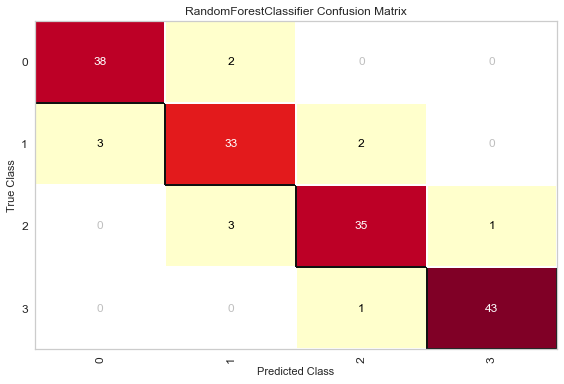

<AxesSubplot:title={'center':'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [131]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(
    RF, classes=[0,1,2,3])


cm.fit(x_train, y_train)
cm.score(x_test, y_test)

cm.poof()

RF model predict 43+35+33+38= 149 samples correctly.

RF model predict 1+1+3+2+3+2= 12 samples incorrectly. 

In [132]:
# Check cross validation on DTs model to estimate model performance (Accuracy)
# use MinMaxScaler 
pipe2 = Pipeline([('RF', RandomForestClassifier())])
Perform_cross_val(pipe2, k=5, x=x_train, y=y_train, scoring='accuracy') 

-------------------- CV for k=5, scoring=accuracy --------------------
CV mean: 0.8749934375372866
CV results: [0.89655172 0.86896552 0.86896552 0.8615917  0.87889273]



scores of all fold are good. 

# MODEL WITH GRIDSEARCHCV

### To apply RF algorithm firstly I used GridSearchCV method to tune parameters. Some parameters are given below. 

In [135]:
'''RF classifier pipeline'''
randomforestCLF = Pipeline(steps = [('scaler' , StandardScaler()) , 
                                    ('rf' , RandomForestClassifier(criterion = 'gini' , n_jobs = -1))])

'''parameters'''
parameters_rf = {'rf__n_estimators':[10 , 100 ,170,200, 250 , 300 , 400 ,  500 , 700],
                 'rf__max_depth' : [ None , 4 , 8  , 10 , 12] ,
                 'rf__min_samples_split': [2,3,4,5,6],
                 'rf__max_features' : ['sqrt' , 'log2'] , 
                 'rf__max_leaf_nodes' : [0 , 4 , 8 , 10] ,
                 'rf__max_samples' : [100 , 250 , 500]}

'''cross validation'''
RF3 = RandomizedSearchCV(randomforestCLF , parameters_rf , cv = 5 , n_iter = 50  , n_jobs = -1 )
RF3.fit(x_train , y_train) 

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                             ('rf',
                                              RandomForestClassifier(n_jobs=-1))]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'rf__max_depth': [None, 4, 8, 10, 12],
                                        'rf__max_features': ['sqrt', 'log2'],
                                        'rf__max_leaf_nodes': [0, 4, 8, 10],
                                        'rf__max_samples': [100, 250, 500],
                                        'rf__min_samples_split': [2, 3, 4, 5,
                                                                  6],
                                        'rf__n_estimators': [10, 100, 170, 200,
                                                             250, 300, 400, 500,
                                                             700]})

In [137]:
print(RF3.best_params_)

{'rf__n_estimators': 250, 'rf__min_samples_split': 5, 'rf__max_samples': 500, 'rf__max_leaf_nodes': 10, 'rf__max_features': 'log2', 'rf__max_depth': 10}


In [138]:
#split X and y in training and test set in 90:10 ratio
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.1 , random_state = 0)

## Now lets build the model with the best parameters we have found with the Gridsearch method.

In [139]:
# MODEL WITH BEST PARAM
RF3 = RandomForestClassifier(max_depth =10,n_estimators=250, min_samples_split=5,
                            max_leaf_nodes=10,max_features='log2', max_samples=500, criterion='gini',random_state = 0)
RF3 = RF3.fit(x_train,y_train)
y_pred = RF3.predict(x_test)

In [141]:
Report(y_test , y_pred) 

Accuracy : 85.09316770186336% 

Confusion Matrix : 

[[38  2  0  0]
 [ 6 26  6  0]
 [ 0  9 29  1]
 [ 0  0  0 44]]

Classification Report : 

              precision    recall  f1-score   support

           0       0.86      0.95      0.90        40
           1       0.70      0.68      0.69        38
           2       0.83      0.74      0.78        39
           3       0.98      1.00      0.99        44

    accuracy                           0.85       161
   macro avg       0.84      0.84      0.84       161
weighted avg       0.85      0.85      0.85       161



In [142]:
print('f1 score is:', metrics.f1_score(y_test, y_pred,average="macro"))

f1 score is: 0.8426607667057104


score of model decrease after use Grid search CV parameters. 

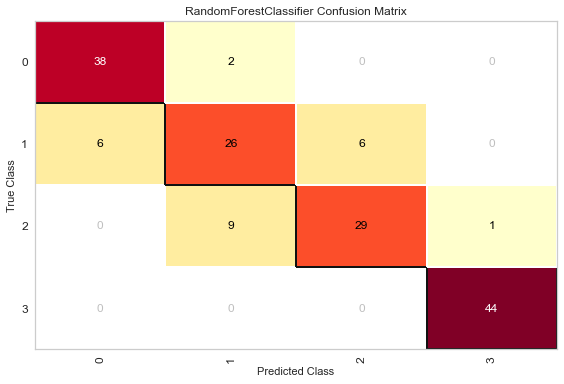

<AxesSubplot:title={'center':'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [143]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(
    RF3, classes=[0,1,2,3])


cm.fit(x_train, y_train)
cm.score(x_test, y_test)

cm.poof() 

RF3 model predict 44+29+26+38= 136 samples correctly.
RF3 model predict 9+6+6+2+1= 24 samples uncorectly
RF model(before use grid search Cv)predicted more number of samples correctly

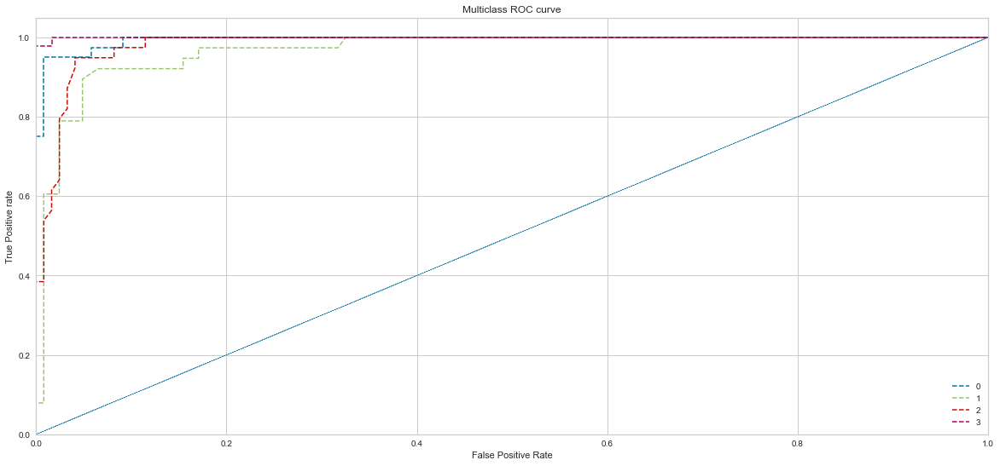

In [144]:
y_Pred_prob = RF.predict_proba(x_test)
def roc_curve_plot(y_actual , y_predicted_probs):
    
    fpr = {}
    tpr = {}
    thres = {}
    roc_auc = dict()

    n_class = np.unique(y_actual).shape[0]
    y_lb = label_binarize(y_test , classes = np.unique(y_actual))

    plt.figure(1 , figsize = (20 , 9))
    for i in range(n_class):
        
        fpr[i] , tpr[i] , thres[i] = roc_curve(y_lb[: , i] , y_predicted_probs[: , i])
        plt.plot(fpr[i] , tpr[i] , '--' , linewidth = 1.5,  label = '{}'.format(i)) 
        plt.plot([0 , 1] , [0 ,1] , 'b--' , linewidth = 0.5)
    plt.xlim([0 , 1])
    plt.ylim([0 , 1.05])
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='lower right')
    plt.show()
    
roc_curve_plot(y_test , y_Pred_prob) 

Best Random forest model=RF

test size=0.1

n_estimators=170

Criterion= gini

Accuracy = 92.54%

# SUPPORT VECTOR MACHINE(SVM) 

In [154]:
#split dataset in features and target variable
x = df.drop('price_range', axis=1)
y = df['price_range'].values.reshape(-1, 1) #Target variable
print('shape of x : {} \nshape of y : {}'.format(x.shape , y.shape))

shape of x : (1609, 20) 
shape of y : (1609, 1)


In [155]:
def SVM_Model(x, y, testSize):

    global x_train , x_test , y_train , y_test , y_pred
    
    rows = []
    
    for n in testSize:
        x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = n , random_state = 0)
        
        # Create SVM model
        svc=SVC(kernel='linear') 

        # fit SVM to training set
        svc.fit(x_train,y_train)

        # make predictions on test set
        y_pred=svc.predict(x_test)
            
        dataset = {'Test_size': n, 'acc': metrics.accuracy_score(y_test, y_pred), 'score': svc.score(x, y)} 
        rows.append(dataset)
        evaluation3 = pd.DataFrame(rows)            
            
    return (evaluation3)   
# We want to hightlight the maximume values
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: green' if v else '' for v in is_max]

In [156]:
evaluation3 = SVM_Model(x, y, [0.1, 0.15, 0.2, 0.25, 0.3])
evaluation3.style.apply(highlight_max)

,Test_size,acc,score
0,0.100000,0.968944,0.989434
1,0.150000,0.975207,0.989434
2,0.200000,0.965839,0.990056
3,0.250000,0.965261,0.989434
4,0.300000,0.968944,0.988813


In [157]:
#split X and y in training and test set in 80:20 ratio
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.2 , random_state = 0)
print('shape of x_train :',x_train.shape)
print('shape of y_train :',y_train.shape)
print('shape of x_test :',x_test.shape)
print('shape of y_test :',y_test.shape)

shape of x_train : (1287, 20)
shape of y_train : (1287, 1)
shape of x_test : (322, 20)
shape of y_test : (322, 1)


In [158]:
# Create SVM model
svm=SVC(kernel='linear',random_state = 1) 

svm.fit(x_train,y_train)

y_pred=svm.predict(x_test)

In [159]:
Report(y_test , y_pred)

Accuracy : 96.58385093167702% 

Confusion Matrix : 

[[82  2  0  0]
 [ 0 69  0  0]
 [ 0  4 84  1]
 [ 0  0  4 76]]

Classification Report : 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        84
           1       0.92      1.00      0.96        69
           2       0.95      0.94      0.95        89
           3       0.99      0.95      0.97        80

    accuracy                           0.97       322
   macro avg       0.97      0.97      0.97       322
weighted avg       0.97      0.97      0.97       322



In [160]:
print('f1 score is:', metrics.f1_score(y_test, y_pred,average="macro"))

f1 score is: 0.9658976372942921


In [161]:
print('Train')
multi_class_metrics(y_train, svm.predict(x_train))
print('\nTest')
multi_class_metrics(y_test, svm.predict(x_test))

Train
Accuracy  :  0.996
Precision :  0.996
Recall    :  0.996
f1        :  0.996

Test
Accuracy  :  0.966
Precision :  0.966
Recall    :  0.966
f1        :  0.966


After applying sklearn library,first model has 0.96 train accuracy

But how can we increase these scores? lets apply gridsearch method

# MODEL WITH GRIDSEARCHCV

To apply svm algorithm firstly I used GridSearchCV method to tune parameters. Some parameters are given below.

In [162]:
kernel=["linear","rbf"]
gamma=["auto",0.01,0.001,0.0001,1]
decision_function_shape=["ovo","ovr"]

In [163]:
svm=SVC(random_state=1)
grid_svm=GridSearchCV(estimator=svm,cv=5,  param_grid=dict(kernel=kernel,
                                                         gamma=gamma,
                                                         decision_function_shape=decision_function_shape))
grid_svm.fit(x_train,y_train)
print("best score: ", grid_svm.best_score_)
print("best param: ", grid_svm.best_params_)

best score:  0.9689289053780955
best param:  {'decision_function_shape': 'ovo', 'gamma': 'auto', 'kernel': 'linear'}


45
45


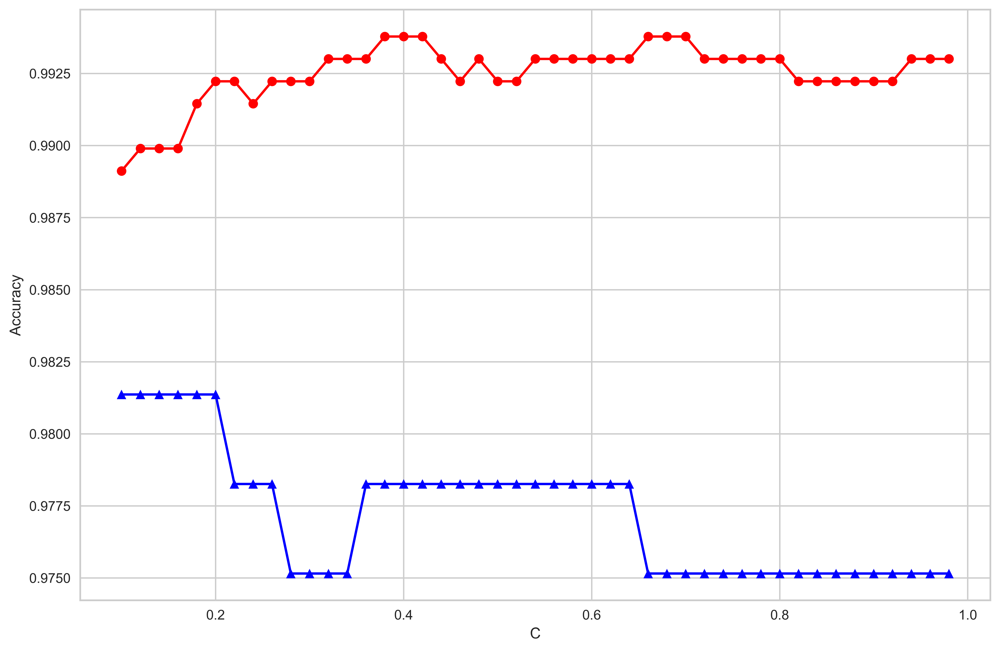

In [164]:
train_score, test_score = [], []
x = df.drop('price_range', axis=1)
y = df['price_range'].values.reshape(-1, 1) #Target variable
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, shuffle = True, random_state = 1)

for i in np.arange(0.1,1,0.02):
    svm = SVC(random_state = 1, kernel = 'linear', decision_function_shape = 'ovo', C = i)
    svm.fit(x_train, y_train)
    train_score.append(svm.score(x_train, y_train))
    test_score.append(svm.score(x_test, y_test))

print(len(train_score))
print(len(test_score))

plt.figure(figsize = (12, 8), dpi = 600)
plt.plot(np.arange(0.1, 1, 0.02), train_score, marker = 'o', color = 'red', label = 'Train')
plt.plot(np.arange(0.1, 1, 0.02), test_score, marker = '^', color = 'blue', label = 'Test')
plt.xlabel('C')
plt.ylabel('Accuracy') 
plt.show() 

Now, lets build the model with the best parameters we have found with the Gridsearch method.

In [165]:
svm1=SVC(C=0.2,decision_function_shape="ovo",gamma="auto",kernel="linear",random_state=1)
svm1.fit(x_train,y_train)
y_pred = svm1.predict(x_test) 

# Evaluation

In [166]:
Report(y_test , y_pred) 

Accuracy : 98.13664596273291% 

Confusion Matrix : 

[[74  0  0  0]
 [ 1 90  3  0]
 [ 0  1 76  1]
 [ 0  0  0 76]]

Classification Report : 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99        74
           1       0.99      0.96      0.97        94
           2       0.96      0.97      0.97        78
           3       0.99      1.00      0.99        76

    accuracy                           0.98       322
   macro avg       0.98      0.98      0.98       322
weighted avg       0.98      0.98      0.98       322



In [167]:
print('f1 score is:', metrics.f1_score(y_test, y_pred,average="macro")) 

f1 score is: 0.981969620526655


In [168]:
print('Train')
multi_class_metrics(y_train, svm.predict(x_train))
print('\nTest')
multi_class_metrics(y_test, svm.predict(x_test))

Train
Accuracy  :  0.993
Precision :  0.993
Recall    :  0.993
f1        :  0.993

Test
Accuracy  :  0.975
Precision :  0.975
Recall    :  0.975
f1        :  0.975


After applying grid search increase score. 

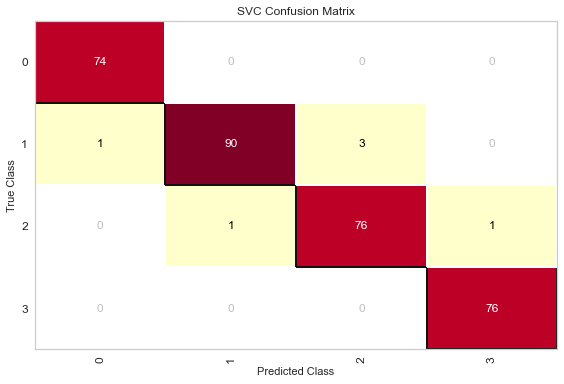

<AxesSubplot:title={'center':'SVC Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [169]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(
    svm1, classes=[0,1,2,3])


cm.fit(x_train, y_train)
cm.score(x_test, y_test)

cm.poof()

svm model predict 76+76+90+74= 316 samples correctly.
svm model predict 1+1+3+1= 6 samples incorrectly. 

## Best SVM model== svm1
## 'C': 0.2, 'decision_function_shape': 'ovo', 'gamma': 'auto', 'kernel': 'linear'
## Accuracy = 98.14%

# Performance

In [170]:
All_models= {'Model':['DTs' , 'RF', 'SVM'],
             'Accuracy': [88.20,92.54,98.14 ],
            'f1_score': [ 87.92,92.32,98.20 ]}
             
comparison = pd.DataFrame(All_models)
comparison  

,Model,Accuracy,f1_score
0,DTs,88.20,87.92
1,RF,92.54,92.32
2,SVM,98.14,98.20


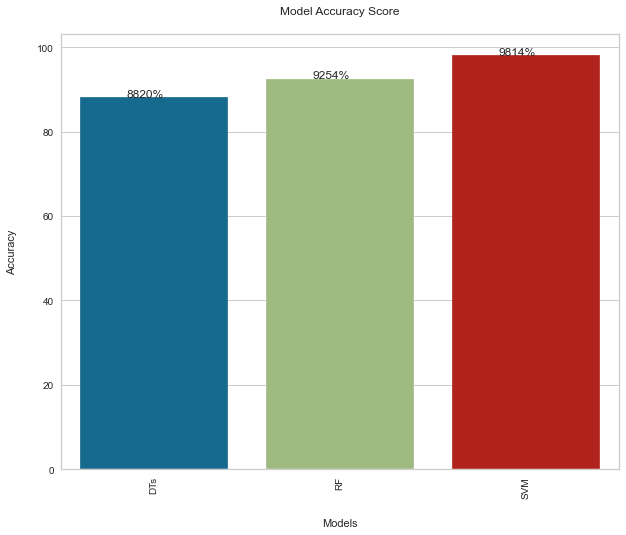

In [171]:
# compare Accuracy in all models
fig,ax=plt.subplots(figsize=(10,8))
sns.barplot(x='Model',y='Accuracy', data=comparison )
ax.set_title("Model Accuracy Score",pad=20)
ax.set_xlabel("Models",labelpad=20)
ax.set_ylabel("Accuracy",labelpad=20)
plt.xticks(rotation=90)

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0%}'.format(height), (x+0.25, y + height + 0.01))

## Accuracy score is more in Svm model. the SVM algorithm is the best for this case study

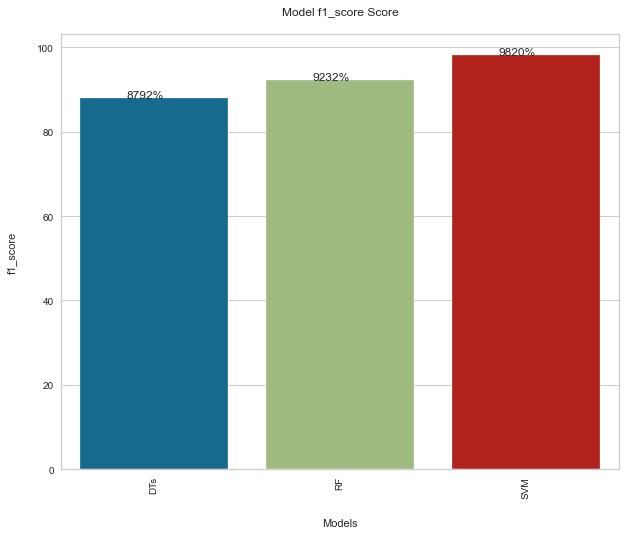

In [172]:
# compare F1_score in all models
fig,ax=plt.subplots(figsize=(10,8))
sns.barplot(x='Model',y='f1_score', data=comparison )
ax.set_title("Model f1_score Score",pad=20)
ax.set_xlabel("Models",labelpad=20)
ax.set_ylabel("f1_score",labelpad=20)
plt.xticks(rotation=90)

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0%}'.format(height), (x+0.25, y + height + 0.01))

## F1_score is more in Svm model. the SVM algorithm is the best for this case study. so we predict data with svm model. 

first we predict several data from train dataset to determine the model predicts correctly.

In [148]:
df.columns.tolist()

['battery_power',
 'blue',
 'clock_speed',
 'dual_sim',
 'fc',
 'four_g',
 'int_memory',
 'm_dep',
 'mobile_wt',
 'n_cores',
 'pc',
 'px_height',
 'px_width',
 'ram',
 'sc_h',
 'sc_w',
 'talk_time',
 'three_g',
 'touch_screen',
 'wifi',
 'price_range']

In [150]:
#create a datafram from 4 smples of train data with price range 0,1,2,3
sample_pred= pd.DataFrame ({'battery_power':[563,1821,794,510],'blue':[1,1,1,1],'clock_speed':[0.5,1.2,0.5,2.0],
                          'dual_sim':[1,0,1,1],'fc':[2,13,0,5] ,'four_g':[1,1,1,1],'int_memory':[41,44,2,45],
                            'm_dep':[0.9,0.6,0.8,0.9],'mobile_wt':[145,141,106,168], 'n_cores':[5,2,6,6], 
                            'pc':[6,14,14,16],'px_height':[1263,1208,122,483],'px_width':[1716,1212,1890,754],
                            'ram':[2603,1411,668,3919],'sc_h':[11,8,13,19],'sc_w':[2,2,4,4],'talk_time':[9,15,19,2],
                            'three_g':[1,1,1,1],'touch_screen':[1,1,1,1], 'wifi':[0,0,0,1],'price_range':[2,1,0,3]})
                            
sample_pred 

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
1,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
2,794,1,0.5,1,0,1,2,0.8,106,6,14,122,1890,668,13,4,19,1,1,0,0
3,510,1,2.0,1,5,1,45,0.9,168,6,16,483,754,3919,19,4,2,1,1,1,3


In [151]:
df_pred= df.append(sample_pred)
df_pred

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
5,1821,0,1.7,0,4,1,10,0.8,139,8,10,381,1018,3220,13,8,18,1,0,1,3
6,1954,0,0.5,1,0,0,24,0.8,187,4,0,512,1149,700,16,3,5,1,1,1,0
7,509,1,0.6,1,2,1,9,0.1,93,5,15,1137,1224,513,19,10,12,1,0,0,0
8,769,1,2.9,1,0,0,9,0.1,182,5,1,248,874,3946,5,2,7,0,0,0,3
9,1520,1,2.2,0,5,1,33,0.5,177,8,18,151,1005,3826,14,9,13,1,1,1,3


In [152]:
#define train and test
train=df_pred.iloc[:1609]
test= df_pred.iloc[1609:] 

In [173]:
x_train= df_pred.drop (['price_range'], axis=1)[:1609]
y_train=df_pred['price_range'][:1609]
x_test=  df_pred.drop (['price_range'], axis=1)[1609:]
svm1.fit(x_train,y_train)

SVC(C=0.2, decision_function_shape='ovo', gamma='auto', kernel='linear',
    random_state=1)

In [174]:
#predict samples
y_pred1=svm1.predict(x_test)
y_pred1

array([2, 1, 0, 3], dtype=int64)

svm model predict all samles correctly. 

so we predict test data (unseen) with svm model

In [175]:
#min of test dataset
df1.min()

id               1.0  
battery_power    500.0
blue             0.0  
clock_speed      0.5  
dual_sim         0.0  
fc               0.0  
four_g           0.0  
int_memory       2.0  
m_dep            0.1  
mobile_wt        80.0 
n_cores          1.0  
pc               0.0  
px_height        0.0  
px_width         501.0
ram              263.0
sc_h             5.0  
sc_w             0.0  
talk_time        2.0  
three_g          0.0  
touch_screen     0.0  
wifi             0.0  
dtype: float64

there are values equal to zero in both "px_height" and "sc_w". The problem with these points is that they cannot represent a feature of a mobile phone, as there is no 1D pixel or a 1D screen. 

In [176]:
px_mask = df1['px_height'] == 0
sc_mask = df1['sc_w'] == 0
print(f'pixel height = 0  :  {sum(px_mask)}')
print(f'screen width = 0  :  {sum(sc_mask)}') 

pixel height = 0  :  2
screen width = 0  :  112


In [177]:
df1=df1[df1['sc_w']>=2]
df1=df1[df1['px_height']>0]
df1.reset_index(inplace=True)
df1.drop('index', axis=1, inplace=True)
df1 

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,3,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
2,5,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1
3,6,1464,1,2.9,1,5,1,50,0.8,198,8,9,569,939,3506,10,7,3,1,1,1
4,7,1718,0,2.4,0,1,0,47,1.0,156,2,3,1283,1374,3873,14,2,10,0,0,0
5,8,833,0,2.4,1,0,0,62,0.8,111,1,2,1312,1880,1495,7,2,18,0,1,1
6,9,1111,1,2.9,1,9,1,25,0.6,101,5,19,556,876,3485,11,9,10,1,1,0
7,11,1500,0,2.2,0,2,0,55,0.6,80,7,6,503,1336,3866,13,7,20,0,1,0
8,12,1343,0,2.9,0,2,1,34,0.8,171,3,6,235,1671,3911,15,8,8,1,1,1
9,13,900,1,1.4,1,0,0,30,1.0,87,2,3,829,1893,439,6,2,20,1,0,0


In [180]:
df1.drop('id',axis=1,inplace=True)

# predict test dataset with svm model (unseen samples) 

In [182]:
#split dataset in features and target variable

y_pred = svm1.predict(df1)

In [183]:
y_pred 

array([3, 2, 1, 3, 3, 1, 3, 3, 3, 0, 2, 0, 2, 1, 3, 3, 1, 3, 0, 2, 0, 3,
       0, 2, 0, 3, 0, 0, 1, 3, 1, 1, 1, 2, 0, 0, 1, 3, 1, 1, 0, 0, 3, 1,
       3, 1, 3, 3, 1, 2, 1, 2, 1, 2, 2, 3, 0, 0, 2, 0, 3, 3, 0, 3, 0, 3,
       1, 3, 1, 2, 2, 1, 2, 2, 0, 0, 3, 0, 2, 0, 1, 2, 3, 3, 2, 3, 3, 3,
       2, 3, 0, 0, 3, 2, 1, 2, 0, 2, 3, 2, 2, 1, 1, 3, 1, 1, 1, 1, 2, 3,
       3, 2, 3, 2, 3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 1, 3, 0, 2, 0, 1, 0,
       0, 1, 2, 1, 0, 0, 1, 2, 2, 1, 0, 0, 1, 0, 1, 0, 2, 3, 3, 2, 2, 2,
       3, 2, 1, 1, 0, 1, 2, 0, 2, 3, 0, 2, 0, 3, 2, 3, 0, 1, 0, 3, 0, 0,
       2, 2, 1, 3, 3, 0, 3, 1, 2, 0, 0, 1, 3, 3, 3, 0, 0, 2, 3, 1, 3, 1,
       3, 1, 2, 3, 3, 1, 0, 1, 3, 1, 1, 3, 2, 1, 0, 1, 2, 1, 0, 3, 2, 3,
       3, 2, 3, 3, 2, 1, 1, 0, 2, 0, 0, 3, 0, 3, 0, 1, 2, 0, 2, 3, 1, 2,
       2, 1, 0, 0, 1, 3, 2, 0, 0, 0, 3, 0, 2, 3, 1, 2, 2, 2, 1, 3, 3, 2,
       2, 3, 3, 3, 3, 3, 1, 3, 3, 0, 1, 0, 3, 1, 2, 3, 0, 0, 0, 0, 2, 0,
       2, 2, 2, 2, 0, 0, 0, 3, 0, 3, 2, 2, 1, 2, 3,

In [184]:
df1['price_range_t'] = y_pred

In [185]:
df1

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range_t
0,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0,3
1,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1,2
2,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1,1
3,1464,1,2.9,1,5,1,50,0.8,198,8,9,569,939,3506,10,7,3,1,1,1,3
4,1718,0,2.4,0,1,0,47,1.0,156,2,3,1283,1374,3873,14,2,10,0,0,0,3
5,833,0,2.4,1,0,0,62,0.8,111,1,2,1312,1880,1495,7,2,18,0,1,1,1
6,1111,1,2.9,1,9,1,25,0.6,101,5,19,556,876,3485,11,9,10,1,1,0,3
7,1500,0,2.2,0,2,0,55,0.6,80,7,6,503,1336,3866,13,7,20,0,1,0,3
8,1343,0,2.9,0,2,1,34,0.8,171,3,6,235,1671,3911,15,8,8,1,1,1,3
9,900,1,1.4,1,0,0,30,1.0,87,2,3,829,1893,439,6,2,20,1,0,0,0


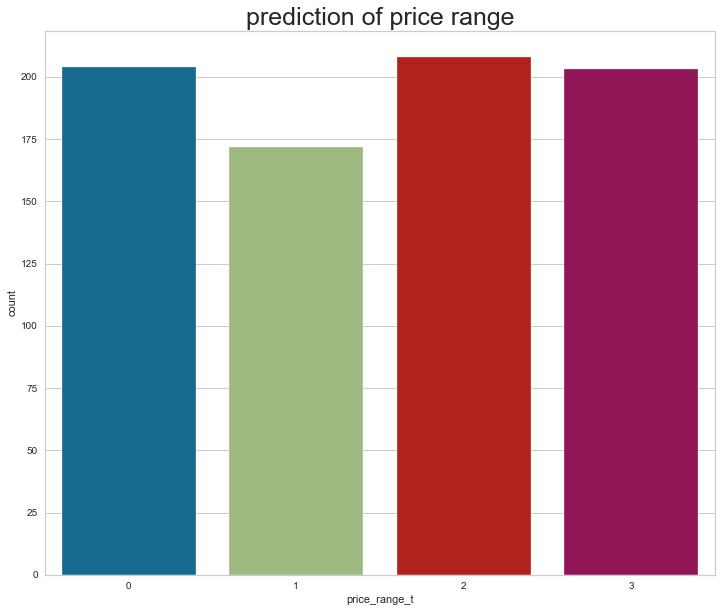

In [186]:
plt.figure(figsize=(12,10))
sns.countplot(x="price_range_t", data=df1)
plt.title("prediction of price range", fontsize=25)
plt.show() 